In [6]:
%load_ext autoreload
%autoreload 2

In [5]:
import sys
sys.path.append("/n/home12/binxuwang/Github/DiffusionLearningCurve")
from core.img_patch_stats_analysis_lib import *

In [3]:
from os.path import join
import torch

def load_dataset(dataset_name, normalize=True):
    import sys
    sys.path.append("/n/home12/binxuwang/Github/edm")
    from training.dataset import TensorDataset, ImageFolderDataset
    edm_dataset_root = "/n/holylfs06/LABS/kempner_fellow_binxuwang/Users/binxuwang/Datasets/EDM_datasets/datasets"
    if dataset_name == "FFHQ":
        edm_ffhq64_path = join(edm_dataset_root, "ffhq-64x64.zip")
        dataset = ImageFolderDataset(edm_ffhq64_path)
        imgsize = 64
    elif dataset_name == "AFHQ":
        edm_afhq_path = join(edm_dataset_root, "afhqv2-64x64.zip")
        dataset = ImageFolderDataset(edm_afhq_path)
        imgsize = 64
    elif dataset_name == "CIFAR":
        edm_cifar_path = join(edm_dataset_root, "cifar10-32x32.zip")
        dataset = ImageFolderDataset(edm_cifar_path)
        imgsize = 32
    print(f"{dataset_name} dataset: {len(dataset)}")
    print(f"value range" , (dataset[0][0].max()), (dataset[0][0].min()))
    Xtsr_raw = torch.stack([torch.from_numpy(dataset[i][0]) for i in range(len(dataset))]) / 255.0
    if normalize:
        print("Normalizing dataset to [-1.0, 1.0]")
        Xtsr = (Xtsr_raw - 0.5) / 0.5
    else:
        Xtsr = Xtsr_raw
    return Xtsr, imgsize


CIFAR dataset: 50000
value range 255 0
Normalizing dataset to [-1.0, 1.0]


### CIFAR10 experiments (pilot lr=1E-3)

In [ ]:
Xtsr, imgsize = load_dataset("CIFAR")

In [ ]:
savedir = r"/n/holylfs06/LABS/kempner_fellow_binxuwang/Users/binxuwang/DL_Projects/DiffusionSpectralLearningCurve/CIFAR10_UNet_CNN_EDM_3blocks_wide128_attn_pilot_fixednorm"
sampledir = r"/n/holylfs06/LABS/kempner_fellow_binxuwang/Users/binxuwang/DL_Projects/DiffusionSpectralLearningCurve/CIFAR10_UNet_CNN_EDM_3blocks_wide128_attn_pilot_fixednorm/samples"
sample_store = sweep_and_create_sample_store(sampledir)

  0%|          | 0/494 [00:00<?, ?it/s]

In [9]:
patch_mean, patch_cov, patch_eigval, patch_eigvec, mean_x_patch_sample_traj, cov_x_patch_sample_traj, diag_cov_x_patch_sample_true_eigenbasis_traj = \
     process_patch_mean_cov_statistics(Xtsr, sample_store, savedir, patch_size=3, patch_stride=1, device="cuda", imgshape=(3, 32, 32))


patch_cov.shape: torch.Size([27]) computed on 50000 images


  0%|          | 0/494 [00:00<?, ?it/s]

Saved to /n/holylfs06/LABS/kempner_fellow_binxuwang/Users/binxuwang/DL_Projects/DiffusionSpectralLearningCurve/CIFAR10_UNet_CNN_EDM_3blocks_wide128_attn_pilot_fixednorm/sample_patch_3x3_stride_1_cov_true_eigenbasis_diag_traj.pkl


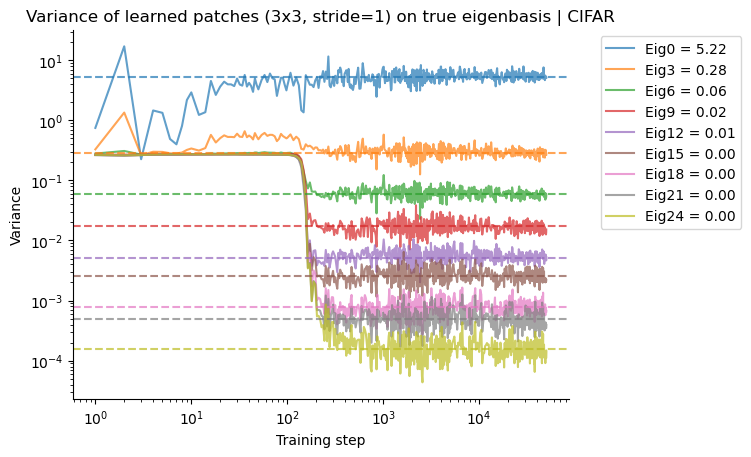

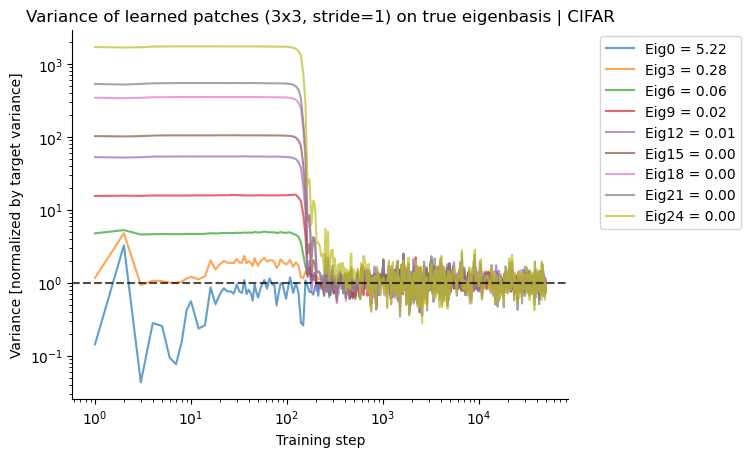

In [13]:
step_slice = sorted(sample_store.keys())
slice2plot = slice(0, 27, 3)
plot_variance_trajectories(step_slice, diag_cov_x_patch_sample_true_eigenbasis_traj, patch_eigval.cpu(), slice2plot,
                               patch_size=3, patch_stride=1, savedir=savedir, dataset_name="CIFAR")

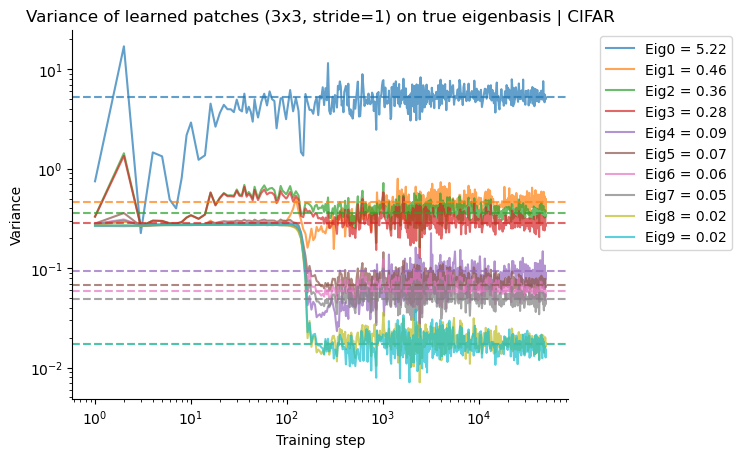

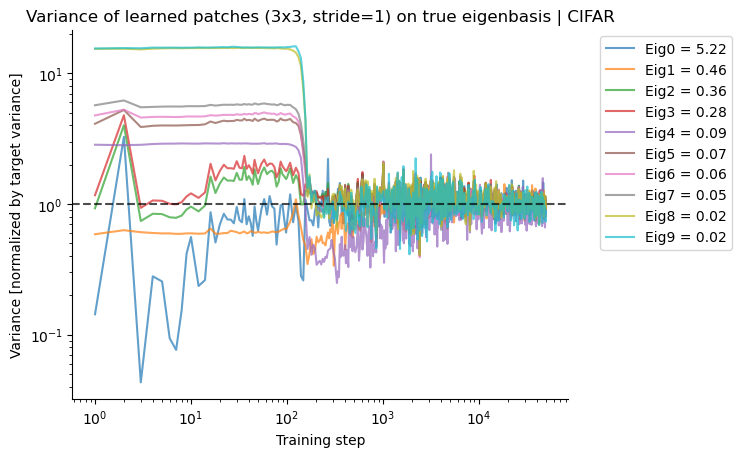

In [14]:
step_slice = sorted(sample_store.keys())
slice2plot = slice(0, 10, 1)
plot_variance_trajectories(step_slice, diag_cov_x_patch_sample_true_eigenbasis_traj.cpu(), patch_eigval.cpu(), slice2plot,
                               patch_size=3, patch_stride=1, savedir=savedir, dataset_name="CIFAR")

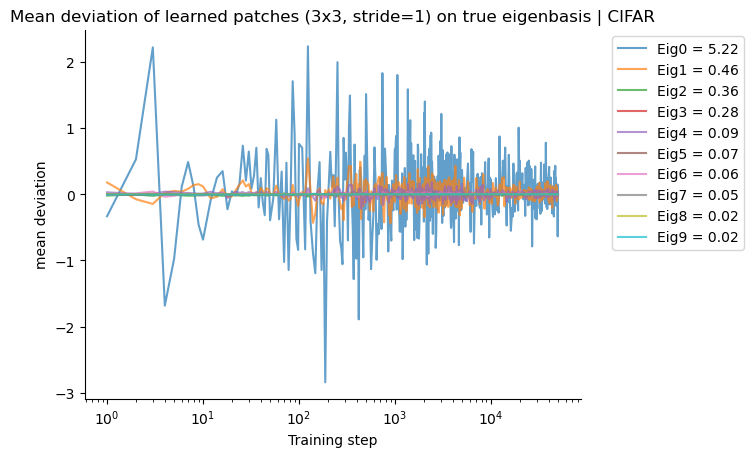

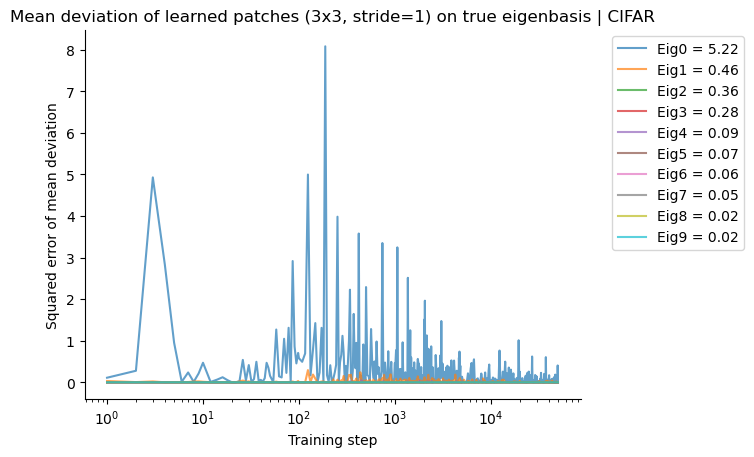

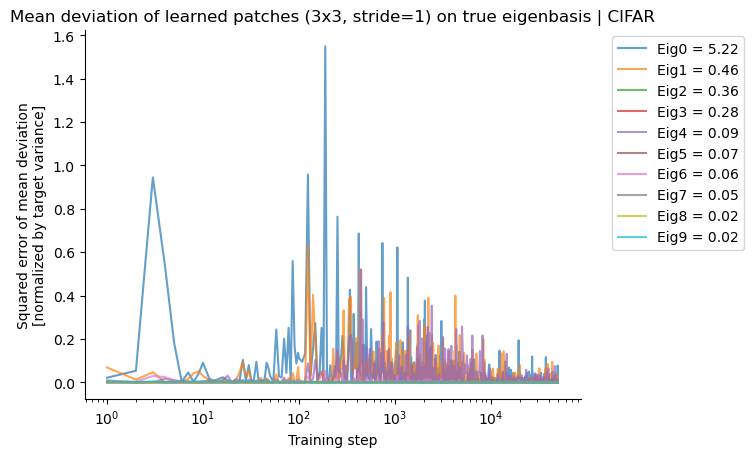

In [16]:
plot_mean_deviation_trajectories(step_slice, mean_x_patch_sample_traj, patch_mean, patch_eigvec.cpu(), patch_eigval.cpu(), 
                                     slice2plot, patch_size=3, patch_stride=1, savedir=savedir, dataset_name="CIFAR")

In [17]:
savedir = r"/n/holylfs06/LABS/kempner_fellow_binxuwang/Users/binxuwang/DL_Projects/DiffusionSpectralLearningCurve/CIFAR10_UNet_CNN_EDM_3blocks_wide128_attn_pilot_fixednorm"
step_slice = sorted(sample_store.keys())
patch_mean, patch_cov, patch_eigval, patch_eigvec, mean_x_patch_sample_traj, cov_x_patch_sample_traj, diag_cov_x_patch_sample_true_eigenbasis_traj = \
     process_patch_mean_cov_statistics(Xtsr, sample_store, savedir, patch_size=6, patch_stride=3, device="cuda", imgshape=(3, 32, 32))

patch_cov.shape: torch.Size([108]) computed on 50000 images


  0%|          | 0/494 [00:00<?, ?it/s]

Saved to /n/holylfs06/LABS/kempner_fellow_binxuwang/Users/binxuwang/DL_Projects/DiffusionSpectralLearningCurve/CIFAR10_UNet_CNN_EDM_3blocks_wide128_attn_pilot_fixednorm/sample_patch_6x6_stride_3_cov_true_eigenbasis_diag_traj.pkl


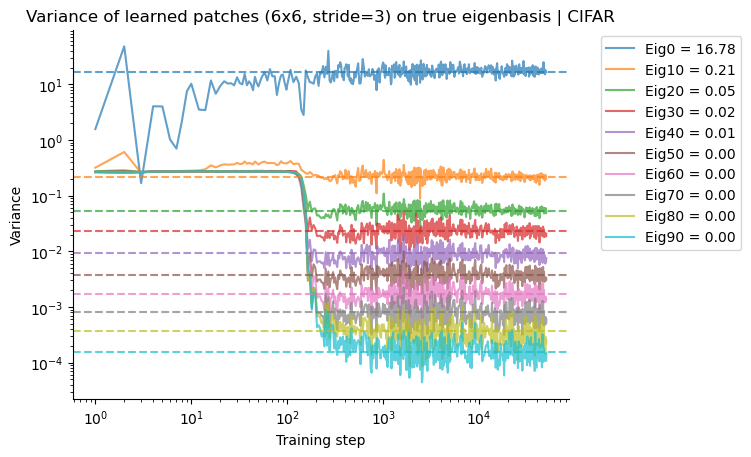

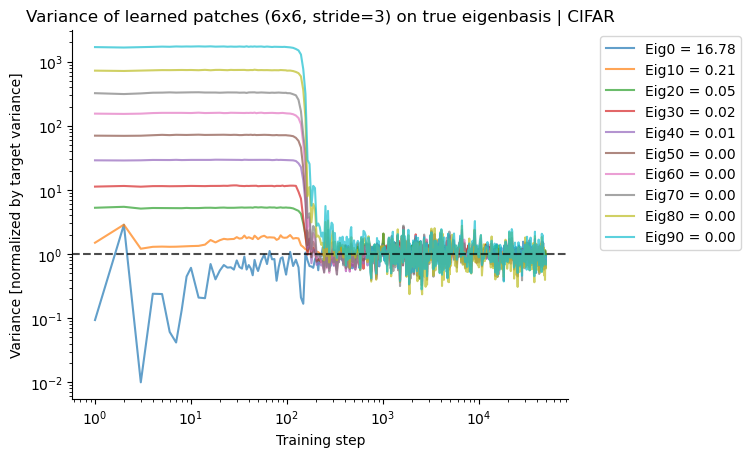

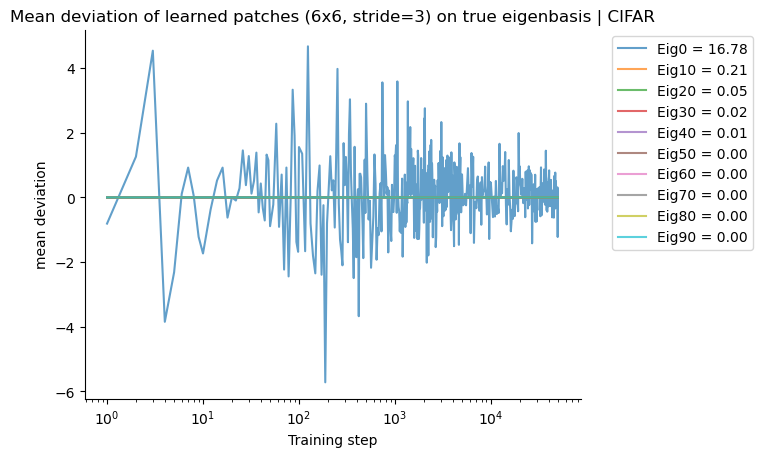

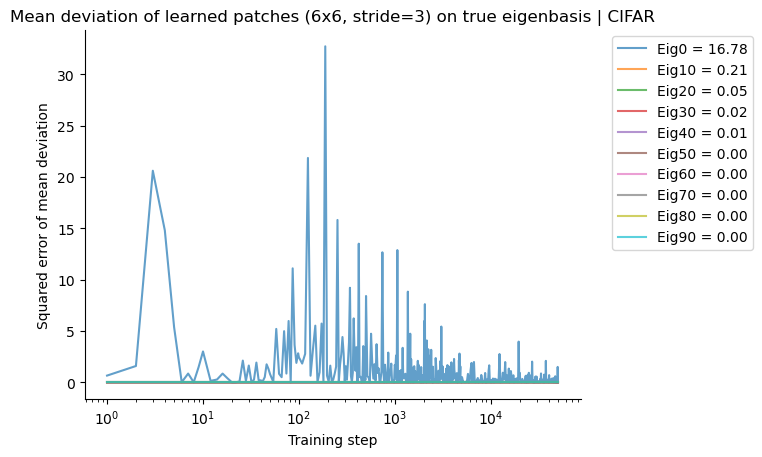

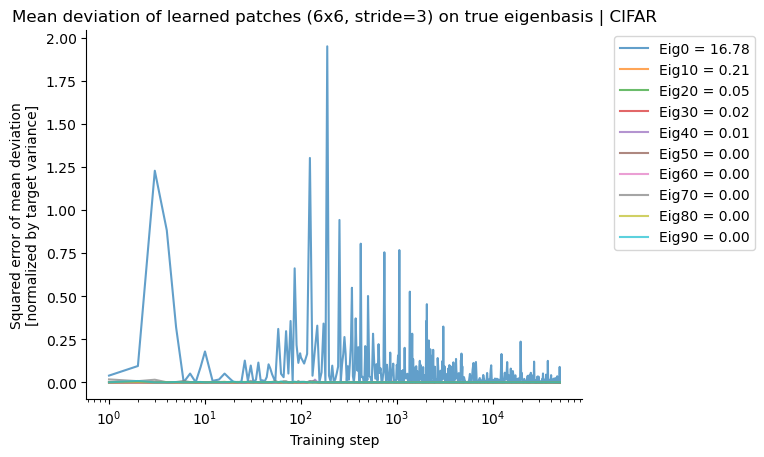

In [18]:
slice2plot = slice(0, 100, 10)
plot_variance_trajectories(step_slice, diag_cov_x_patch_sample_true_eigenbasis_traj, patch_eigval.cpu(), slice2plot,
                               patch_size=6, patch_stride=3, savedir=savedir, dataset_name="CIFAR")
plot_mean_deviation_trajectories(step_slice, mean_x_patch_sample_traj, patch_mean, patch_eigvec.cpu(), patch_eigval.cpu(), 
                                     slice2plot, patch_size=6, patch_stride=3, savedir=savedir, dataset_name="CIFAR")

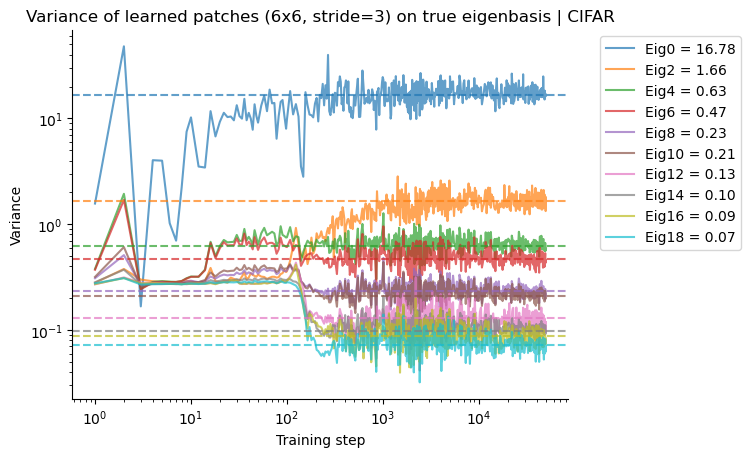

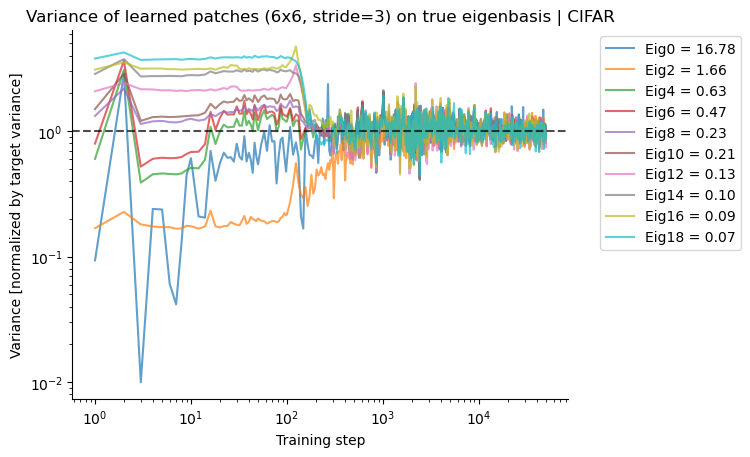

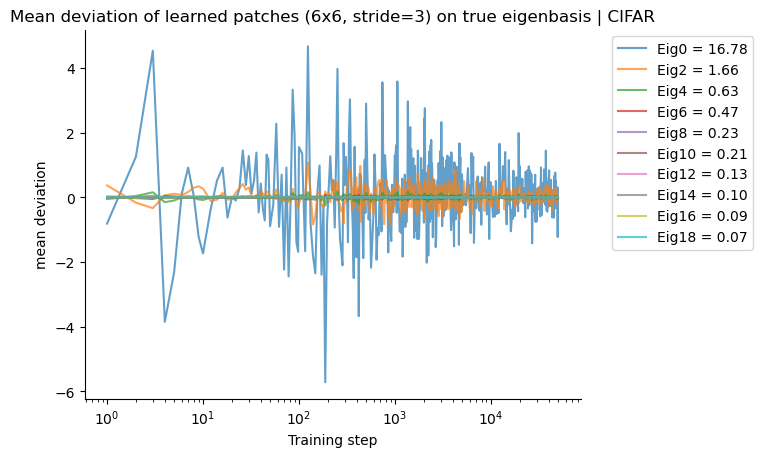

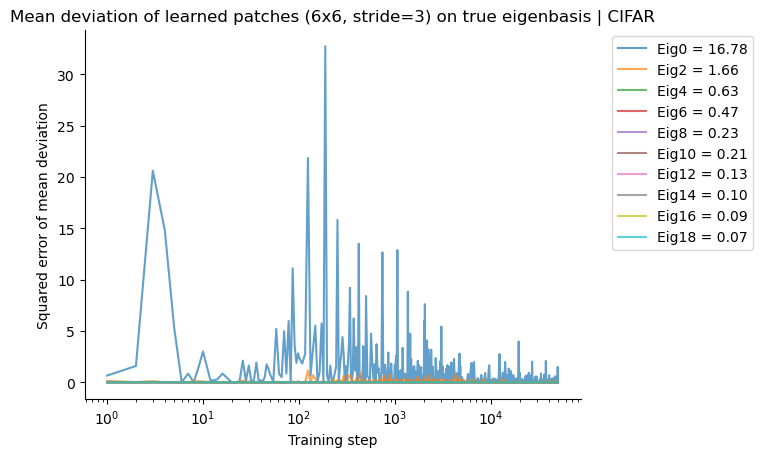

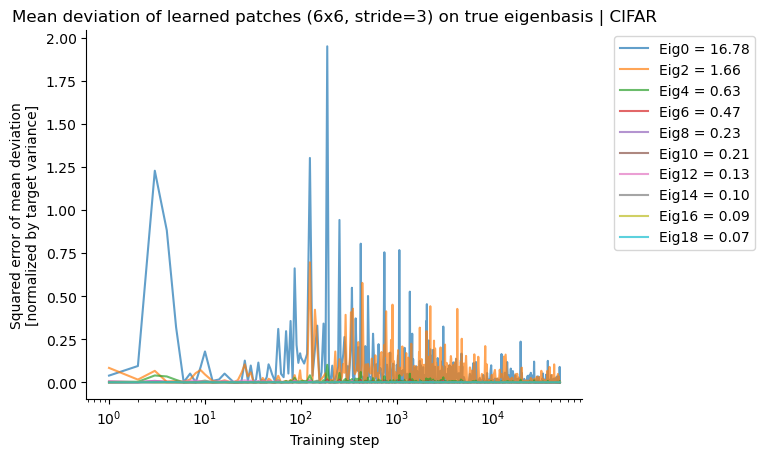

In [19]:
slice2plot = slice(0, 20, 2)
plot_variance_trajectories(step_slice, diag_cov_x_patch_sample_true_eigenbasis_traj.cpu(), patch_eigval.cpu(), slice2plot,
                               patch_size=6, patch_stride=3, savedir=savedir, dataset_name="CIFAR")
plot_mean_deviation_trajectories(step_slice, mean_x_patch_sample_traj, patch_mean, patch_eigvec.cpu(), patch_eigval.cpu(), 
                                     slice2plot, patch_size=6, patch_stride=3, savedir=savedir, dataset_name="CIFAR")

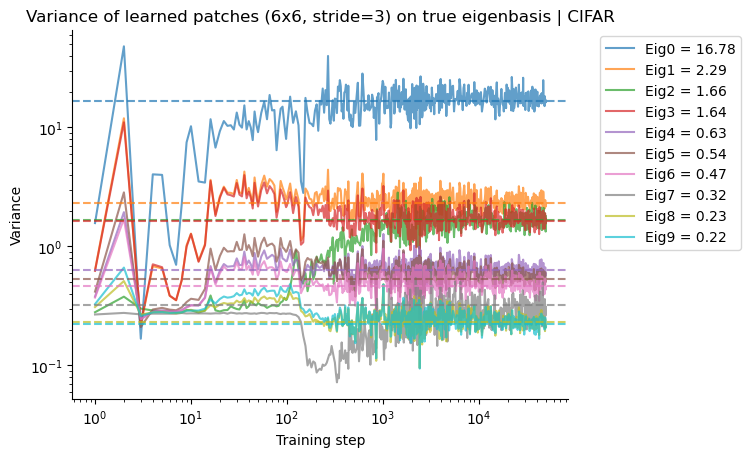

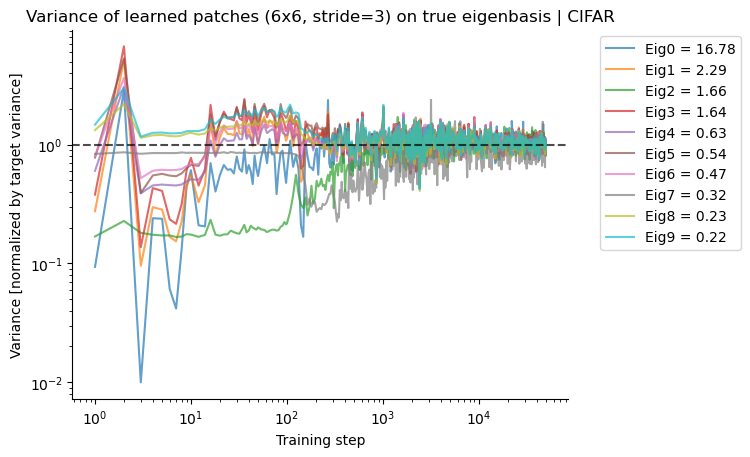

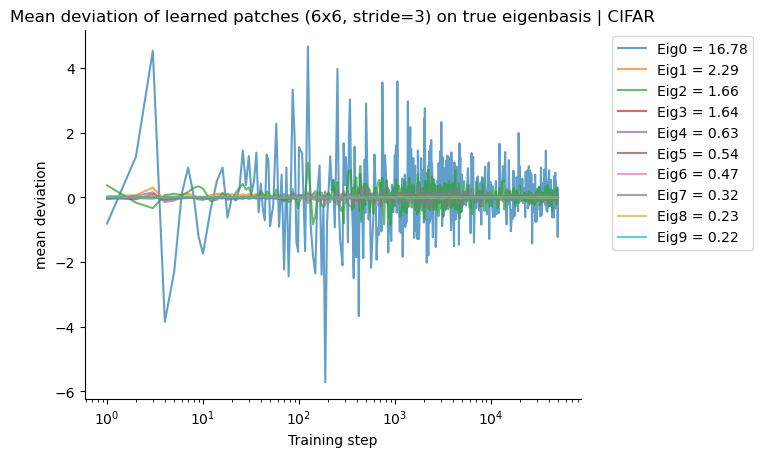

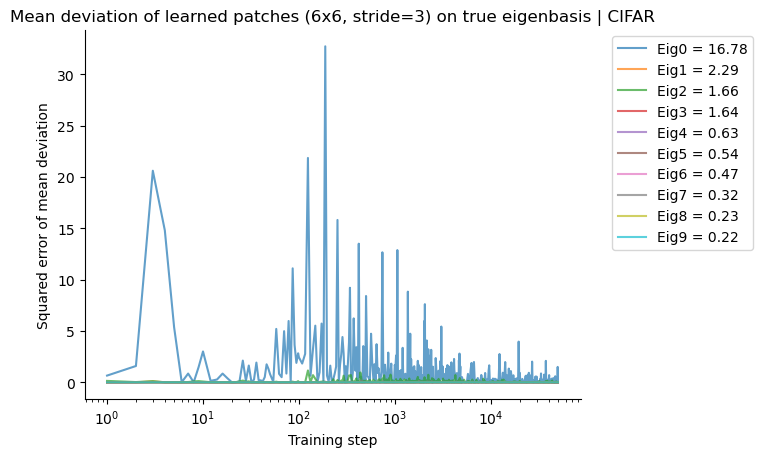

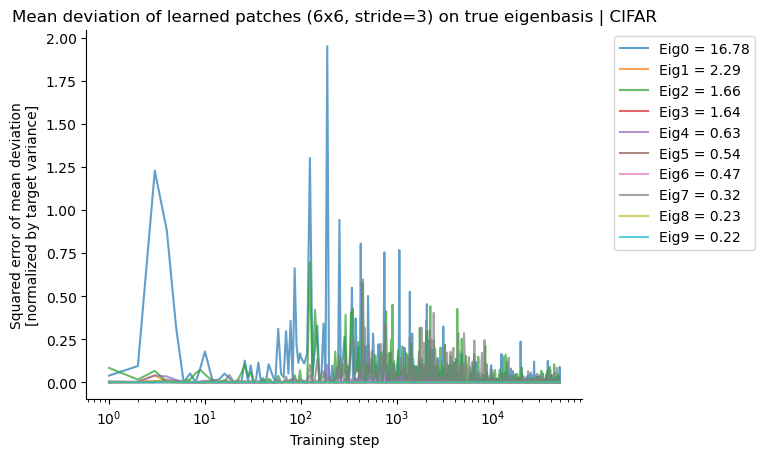

In [20]:
slice2plot = slice(0, 10, 1)
plot_variance_trajectories(step_slice, diag_cov_x_patch_sample_true_eigenbasis_traj.cpu(), patch_eigval.cpu(), slice2plot,
                               patch_size=6, patch_stride=3, savedir=savedir, dataset_name="CIFAR")
plot_mean_deviation_trajectories(step_slice, mean_x_patch_sample_traj, patch_mean, patch_eigvec.cpu(), patch_eigval.cpu(), 
                                     slice2plot, patch_size=6, patch_stride=3, savedir=savedir, dataset_name="CIFAR")

### CIFAR10 small lr

In [ ]:
Xtsr, imgsize = load_dataset("CIFAR", normalize=True)
savedir = r"/n/holylfs06/LABS/kempner_fellow_binxuwang/Users/binxuwang/DL_Projects/DiffusionSpectralLearningCurve/CIFAR10_UNet_CNN_EDM_3blocks_wide128_attn_pilot_fixednorm_smalllr"
sampledir = r"/n/holylfs06/LABS/kempner_fellow_binxuwang/Users/binxuwang/DL_Projects/DiffusionSpectralLearningCurve/CIFAR10_UNet_CNN_EDM_3blocks_wide128_attn_pilot_fixednorm_smalllr/samples"
sample_store = sweep_and_create_sample_store(sampledir)


CIFAR dataset: 50000
value range 255 0
Normalizing dataset to [-1.0, 1.0]


  0%|          | 0/78 [00:00<?, ?it/s]

In [38]:
sample_store = sweep_and_create_sample_store(sampledir)

  0%|          | 0/93 [00:00<?, ?it/s]

#### patch 3x3 stride 1

In [39]:
step_slice = sorted(sample_store.keys())
patch_mean, patch_cov, patch_eigval, patch_eigvec, mean_x_patch_sample_traj, cov_x_patch_sample_traj, diag_cov_x_patch_sample_true_eigenbasis_traj = \
     process_patch_mean_cov_statistics(Xtsr, sample_store, savedir, patch_size=3, patch_stride=1, device="cuda", imgshape=(3, 32, 32))


patch_cov.shape: torch.Size([27]) computed on 50000 images


  0%|          | 0/93 [00:00<?, ?it/s]

Saved to /n/holylfs06/LABS/kempner_fellow_binxuwang/Users/binxuwang/DL_Projects/DiffusionSpectralLearningCurve/CIFAR10_UNet_CNN_EDM_3blocks_wide128_attn_pilot_fixednorm_smalllr/sample_patch_3x3_stride_1_cov_true_eigenbasis_diag_traj.pkl


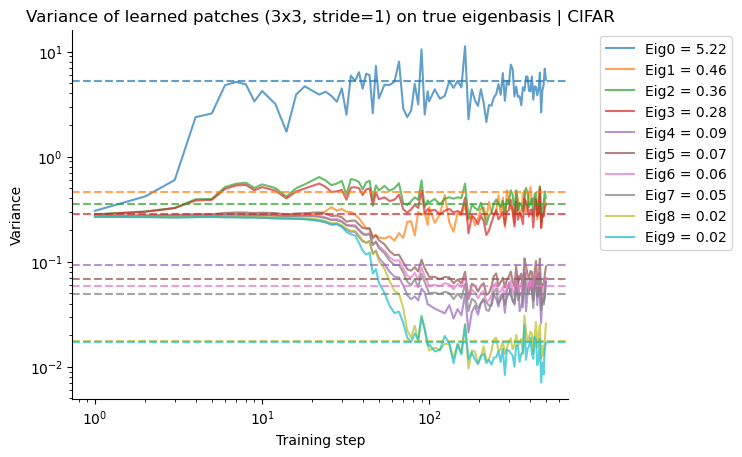

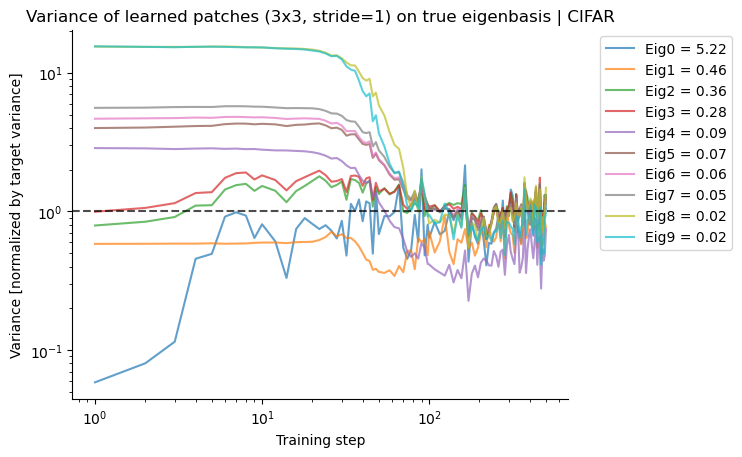

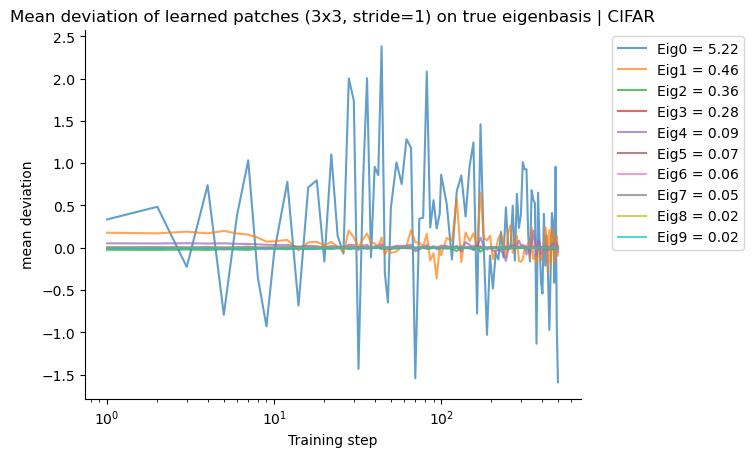

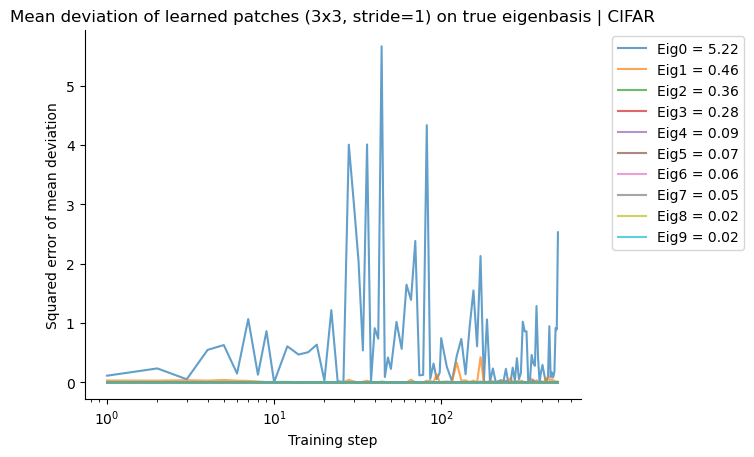

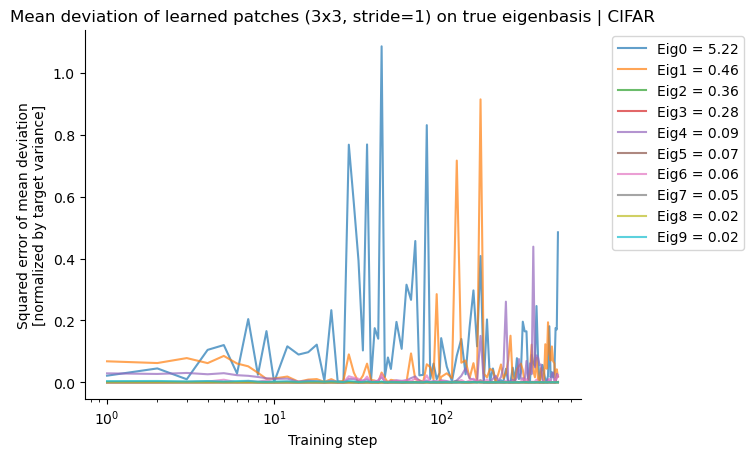

In [40]:
slice2plot = slice(0, 10, 1)
plot_variance_trajectories(step_slice, diag_cov_x_patch_sample_true_eigenbasis_traj.cpu(), patch_eigval.cpu(), slice2plot,
                               patch_size=3, patch_stride=1, savedir=savedir, dataset_name="CIFAR")
plot_mean_deviation_trajectories(step_slice, mean_x_patch_sample_traj, patch_mean, patch_eigvec.cpu(), patch_eigval.cpu(), 
                                     slice2plot, patch_size=3, patch_stride=1, savedir=savedir, dataset_name="CIFAR")

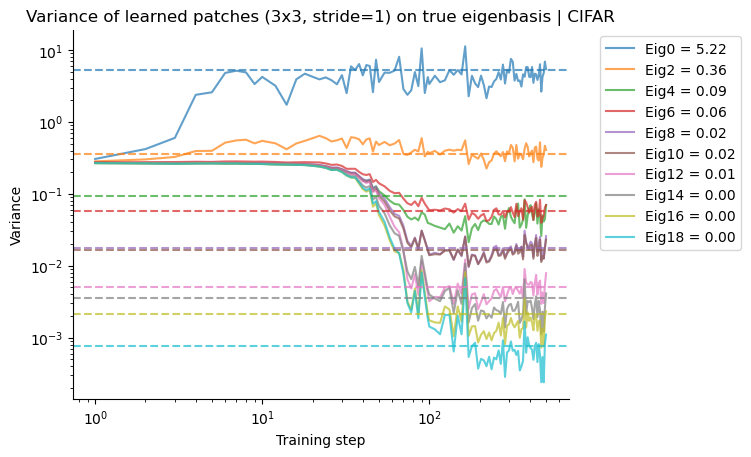

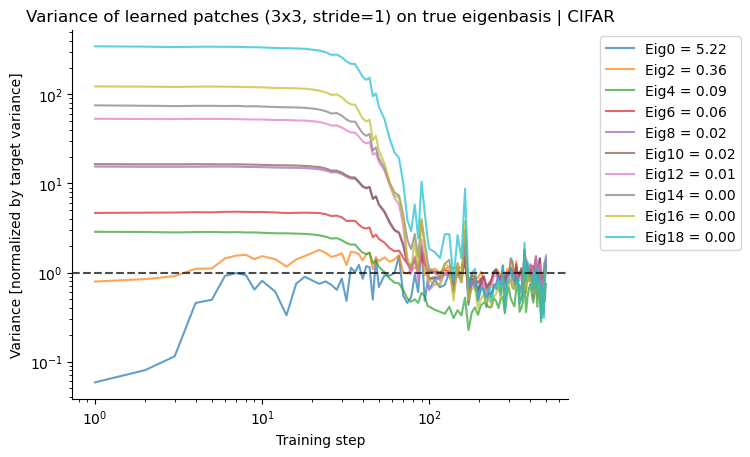

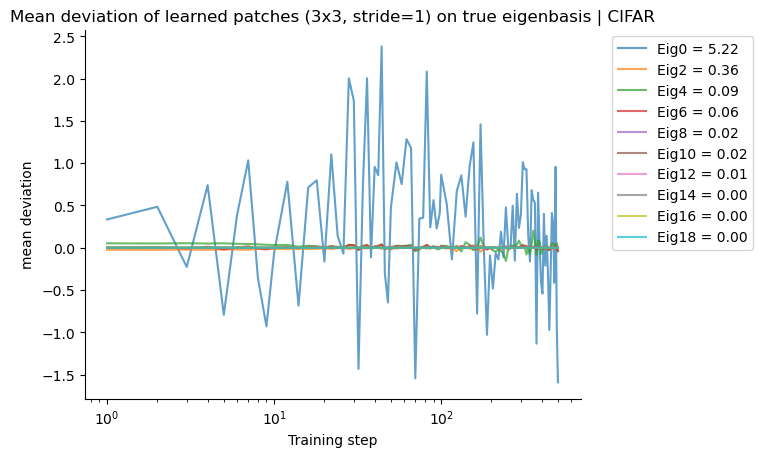

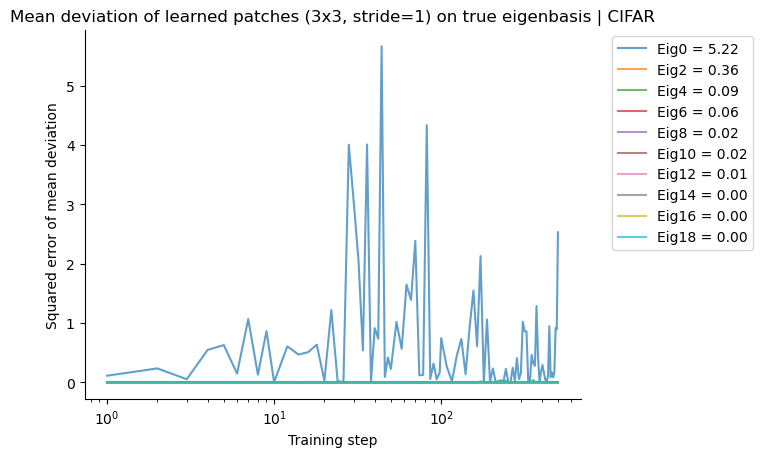

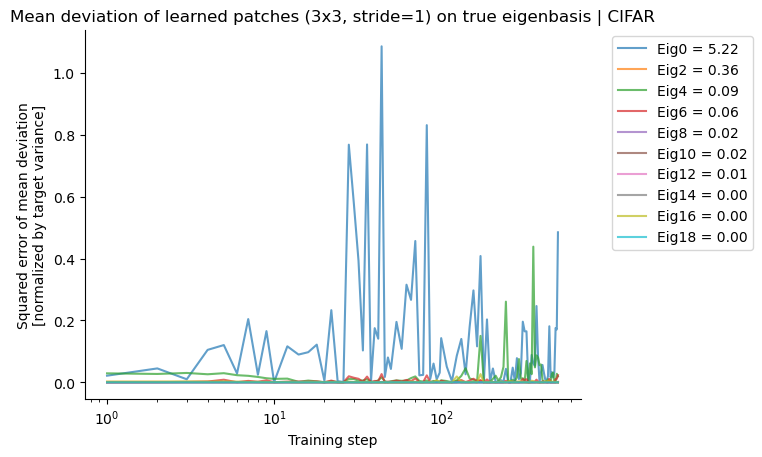

In [41]:
slice2plot = slice(0, 20, 2)
plot_variance_trajectories(step_slice, diag_cov_x_patch_sample_true_eigenbasis_traj.cpu(), patch_eigval.cpu(), slice2plot,
                               patch_size=3, patch_stride=1, savedir=savedir, dataset_name="CIFAR")
plot_mean_deviation_trajectories(step_slice, mean_x_patch_sample_traj, patch_mean, patch_eigvec.cpu(), patch_eigval.cpu(), 
                                     slice2plot, patch_size=3, patch_stride=1, savedir=savedir, dataset_name="CIFAR")

#### patch 6x6 stride 1

In [42]:
step_slice = sorted(sample_store.keys())
patch_mean, patch_cov, patch_eigval, patch_eigvec, mean_x_patch_sample_traj, cov_x_patch_sample_traj, diag_cov_x_patch_sample_true_eigenbasis_traj = \
     process_patch_mean_cov_statistics(Xtsr, sample_store, savedir, patch_size=6, patch_stride=1, device="cuda", imgshape=(3, 32, 32))

patch_cov.shape: torch.Size([108]) computed on 50000 images


  0%|          | 0/93 [00:00<?, ?it/s]

Saved to /n/holylfs06/LABS/kempner_fellow_binxuwang/Users/binxuwang/DL_Projects/DiffusionSpectralLearningCurve/CIFAR10_UNet_CNN_EDM_3blocks_wide128_attn_pilot_fixednorm_smalllr/sample_patch_6x6_stride_1_cov_true_eigenbasis_diag_traj.pkl


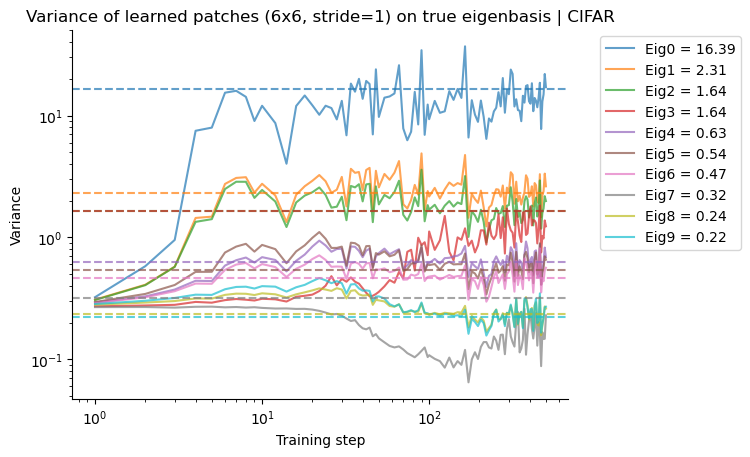

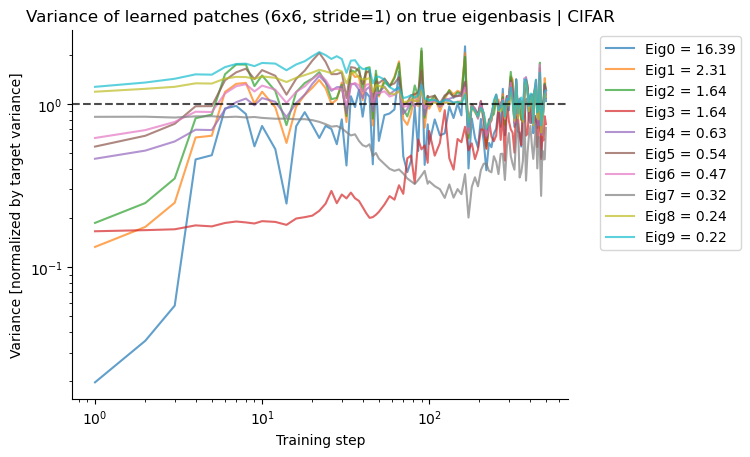

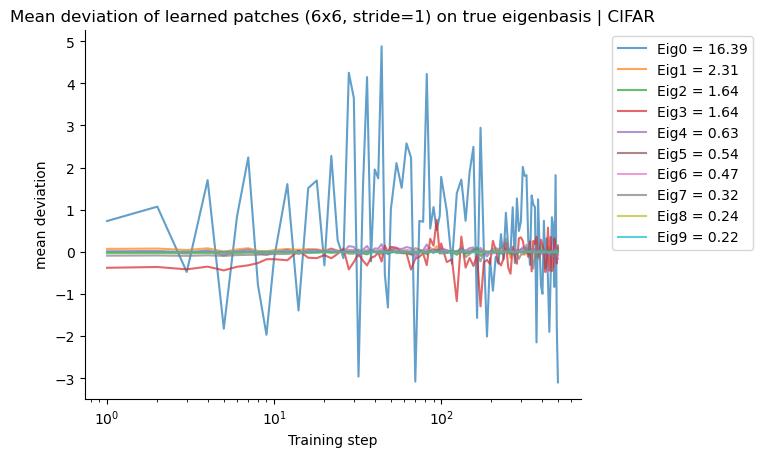

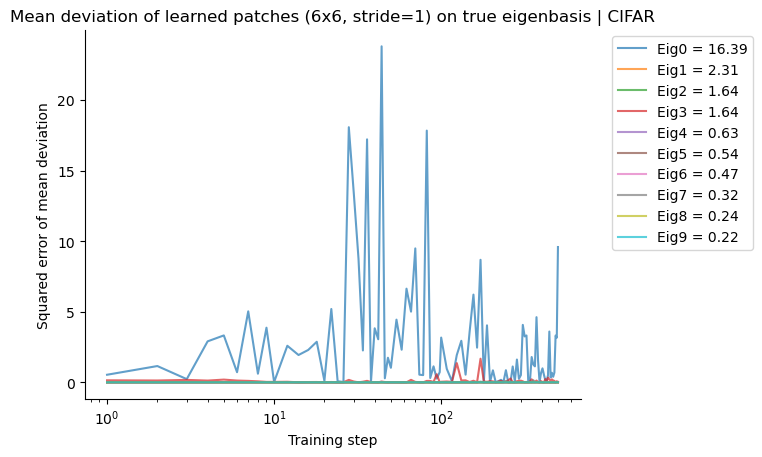

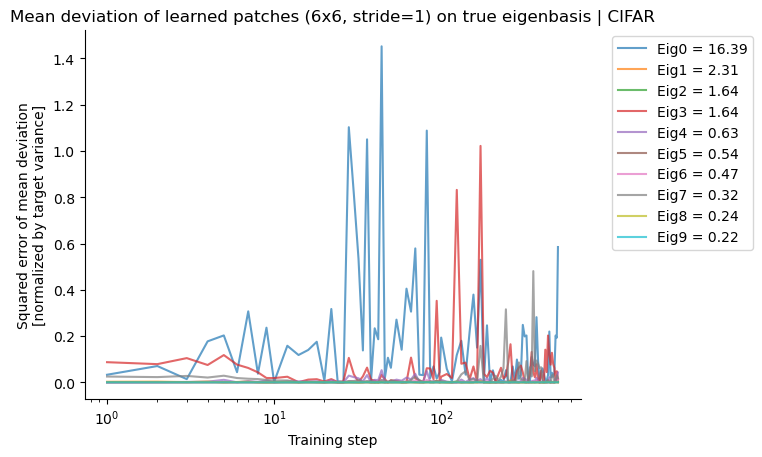

In [43]:
slice2plot = slice(0, 10, 1)
plot_variance_trajectories(step_slice, diag_cov_x_patch_sample_true_eigenbasis_traj.cpu(), patch_eigval.cpu(), slice2plot,
                               patch_size=6, patch_stride=1, savedir=savedir, dataset_name="CIFAR")
plot_mean_deviation_trajectories(step_slice, mean_x_patch_sample_traj, patch_mean, patch_eigvec.cpu(), patch_eigval.cpu(), 
                                     slice2plot, patch_size=6, patch_stride=1, savedir=savedir, dataset_name="CIFAR")

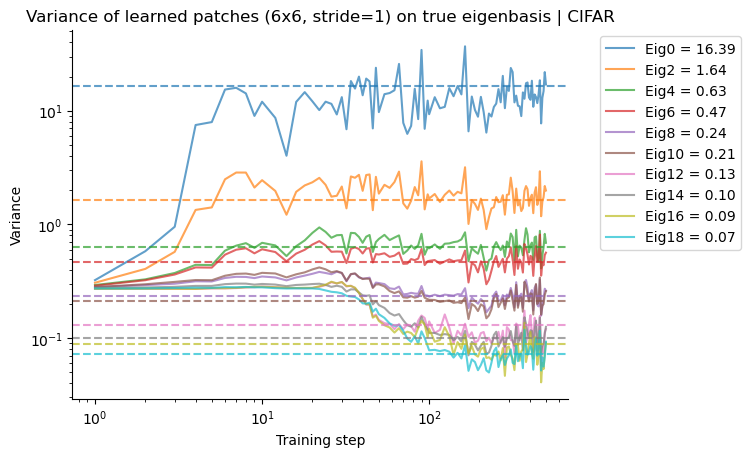

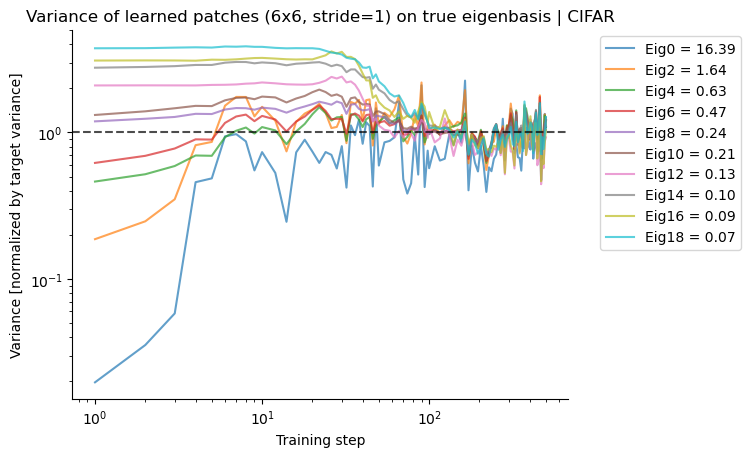

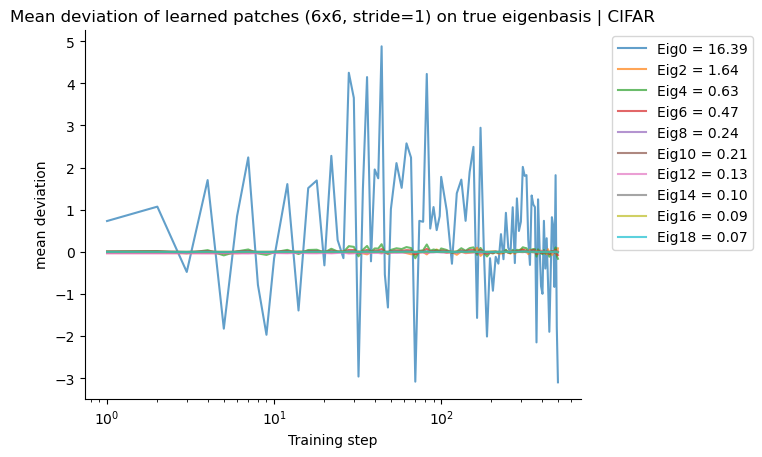

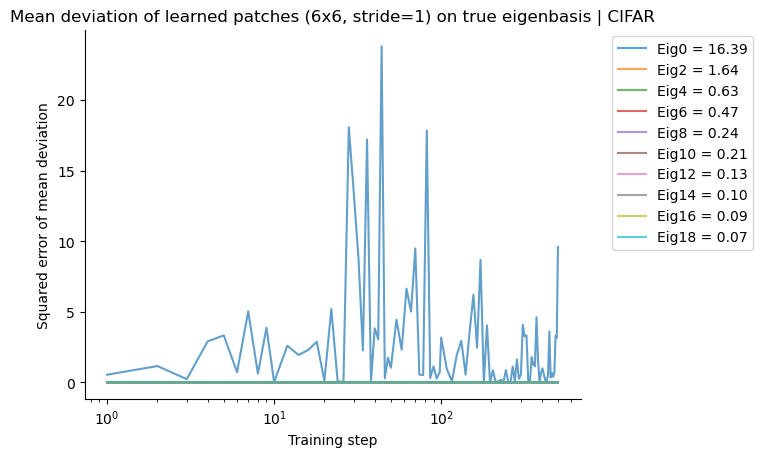

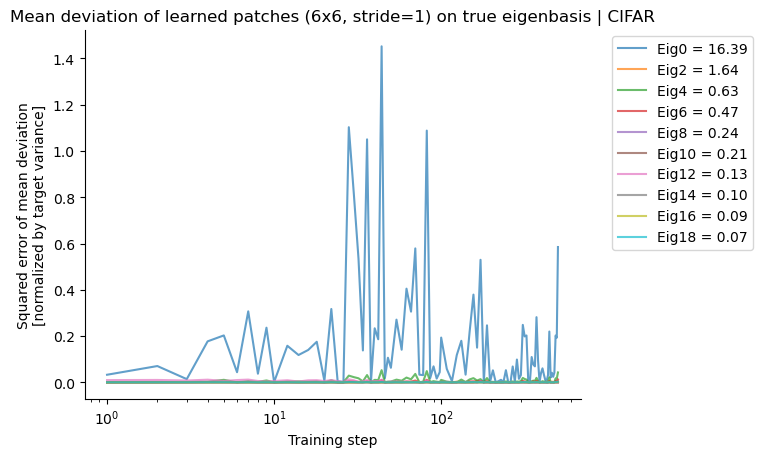

In [44]:
slice2plot = slice(0, 20, 2)
plot_variance_trajectories(step_slice, diag_cov_x_patch_sample_true_eigenbasis_traj.cpu(), patch_eigval.cpu(), slice2plot,
                               patch_size=6, patch_stride=1, savedir=savedir, dataset_name="CIFAR")
plot_mean_deviation_trajectories(step_slice, mean_x_patch_sample_traj, patch_mean, patch_eigvec.cpu(), patch_eigval.cpu(), 
                                     slice2plot, patch_size=6, patch_stride=1, savedir=savedir, dataset_name="CIFAR")


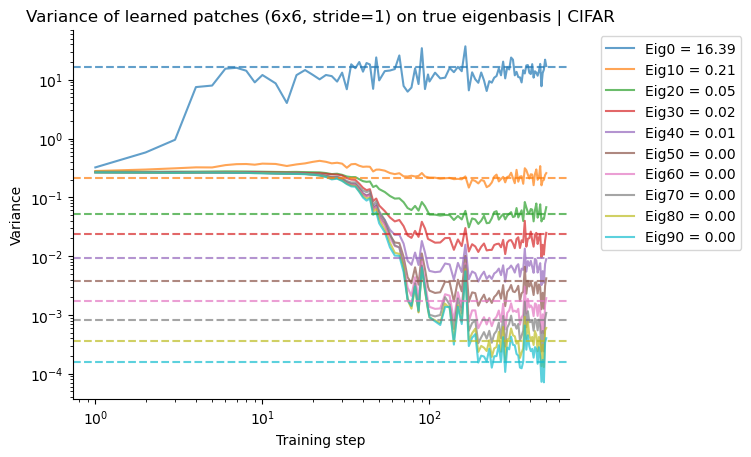

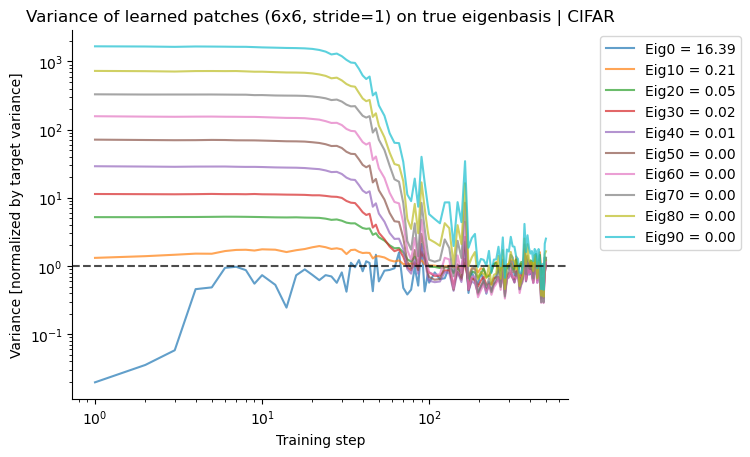

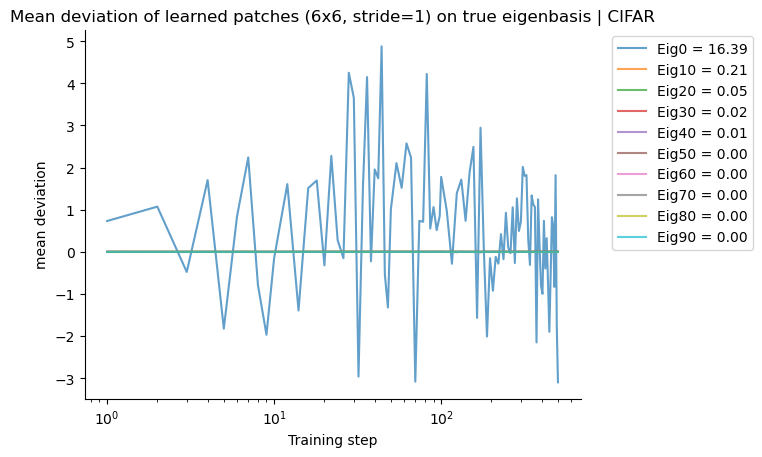

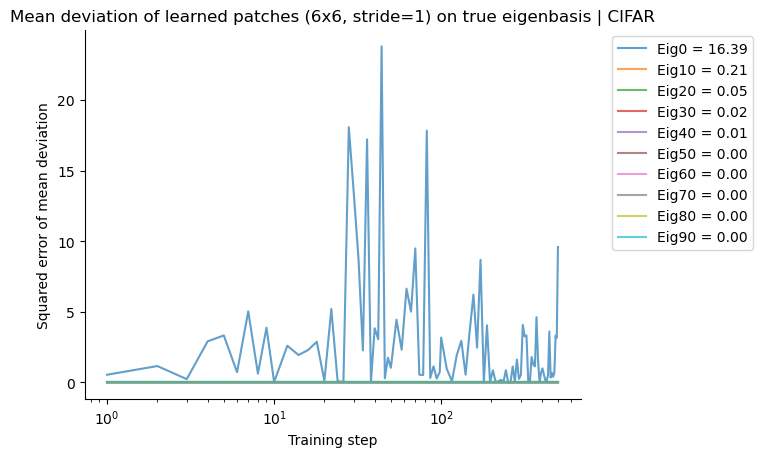

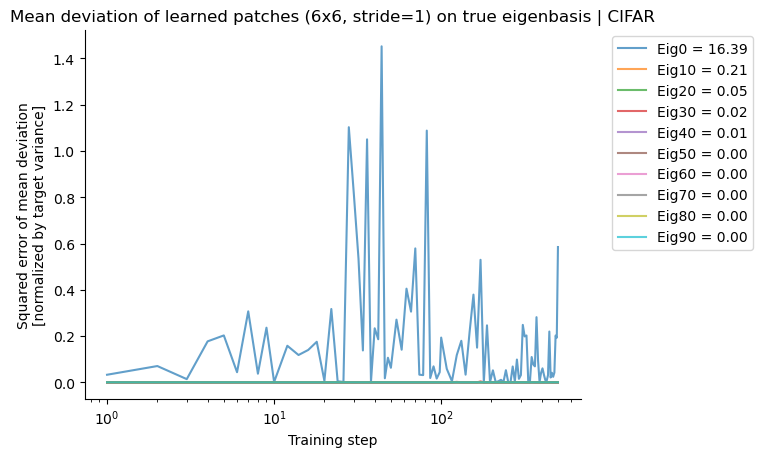

In [45]:
slice2plot = slice(0, 100, 10)
plot_variance_trajectories(step_slice, diag_cov_x_patch_sample_true_eigenbasis_traj.cpu(), patch_eigval.cpu(), slice2plot,
                               patch_size=6, patch_stride=1, savedir=savedir, dataset_name="CIFAR")
plot_mean_deviation_trajectories(step_slice, mean_x_patch_sample_traj, patch_mean, patch_eigvec.cpu(), patch_eigval.cpu(), 
                                     slice2plot, patch_size=6, patch_stride=1, savedir=savedir, dataset_name="CIFAR")


#### patch 6x6 stride 3

In [46]:
step_slice = sorted(sample_store.keys())
patch_mean, patch_cov, patch_eigval, patch_eigvec, mean_x_patch_sample_traj, cov_x_patch_sample_traj, diag_cov_x_patch_sample_true_eigenbasis_traj = \
     process_patch_mean_cov_statistics(Xtsr, sample_store, savedir, patch_size=6, patch_stride=3, device="cuda", imgshape=(3, 32, 32))

patch_cov.shape: torch.Size([108]) computed on 50000 images


  0%|          | 0/93 [00:00<?, ?it/s]

Saved to /n/holylfs06/LABS/kempner_fellow_binxuwang/Users/binxuwang/DL_Projects/DiffusionSpectralLearningCurve/CIFAR10_UNet_CNN_EDM_3blocks_wide128_attn_pilot_fixednorm_smalllr/sample_patch_6x6_stride_3_cov_true_eigenbasis_diag_traj.pkl


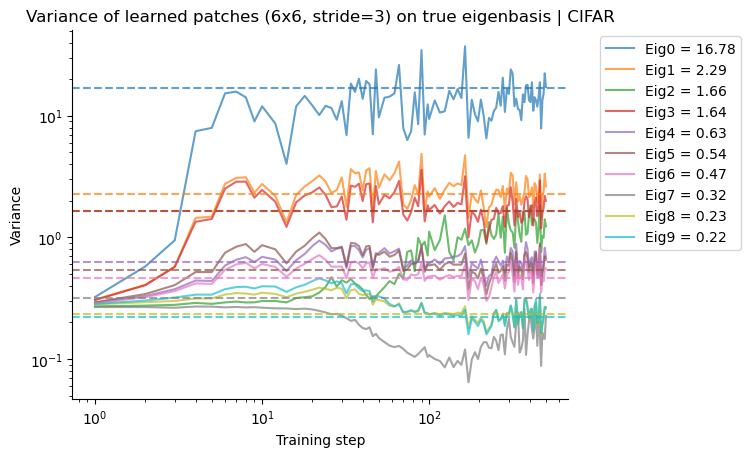

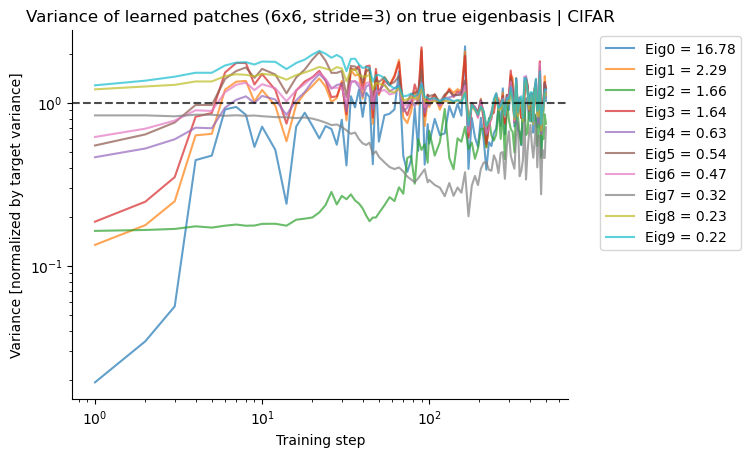

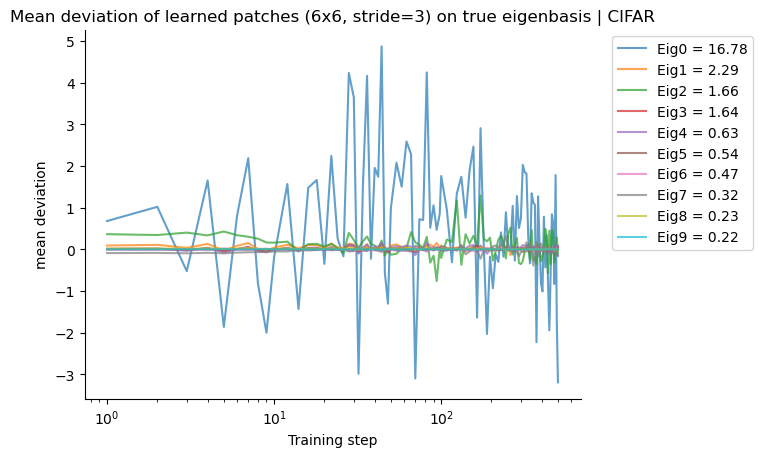

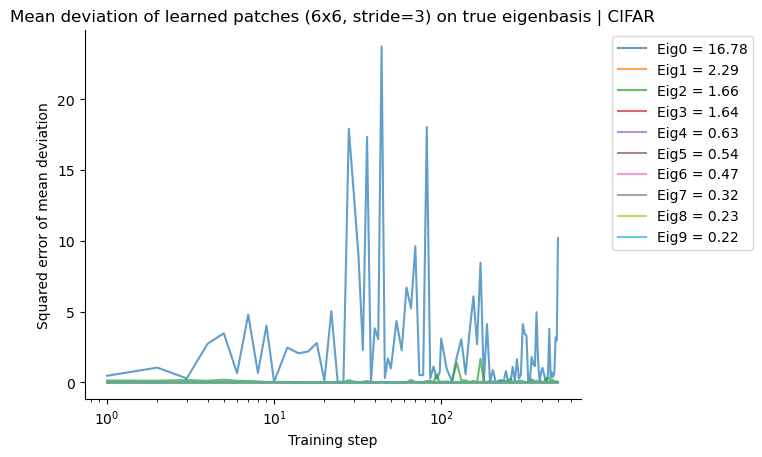

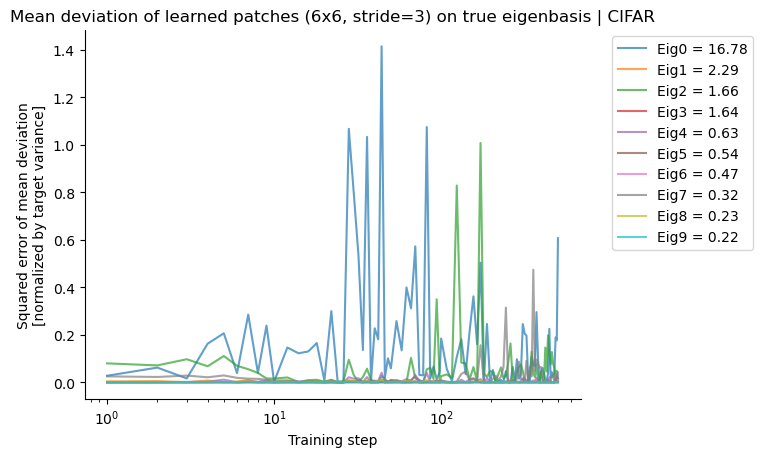

In [47]:
slice2plot = slice(0, 10, 1)
plot_variance_trajectories(step_slice, diag_cov_x_patch_sample_true_eigenbasis_traj.cpu(), patch_eigval.cpu(), slice2plot,
                               patch_size=6, patch_stride=3, savedir=savedir, dataset_name="CIFAR")
plot_mean_deviation_trajectories(step_slice, mean_x_patch_sample_traj, patch_mean, patch_eigvec.cpu(), patch_eigval.cpu(), 
                                     slice2plot, patch_size=6, patch_stride=3, savedir=savedir, dataset_name="CIFAR")

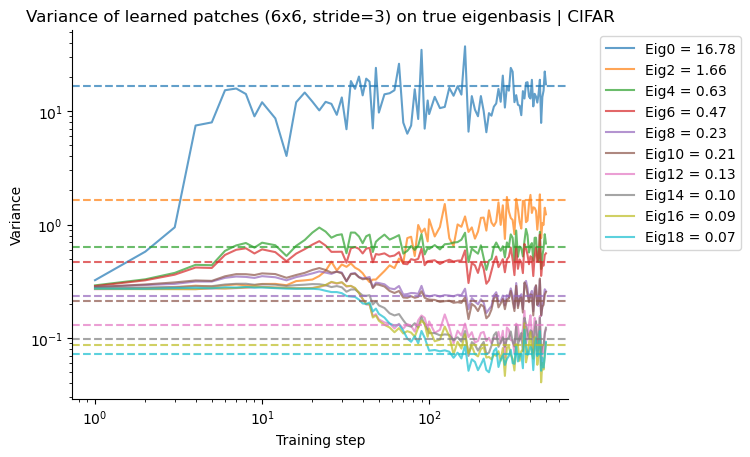

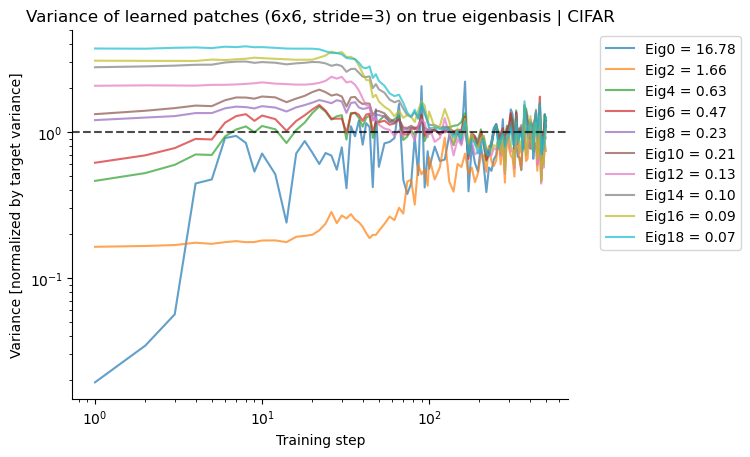

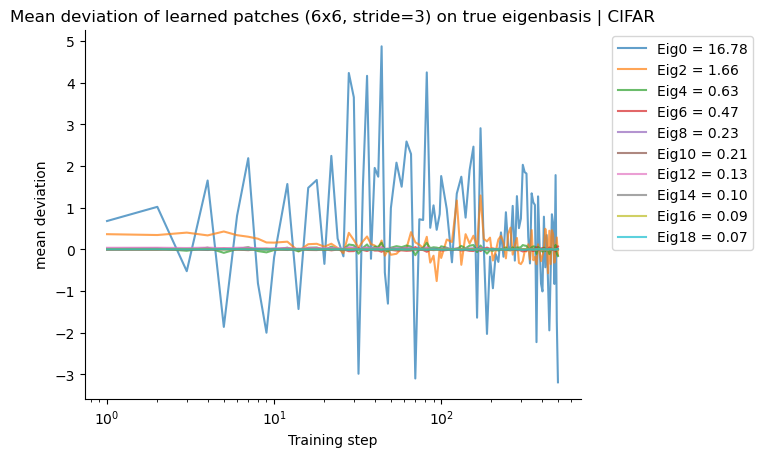

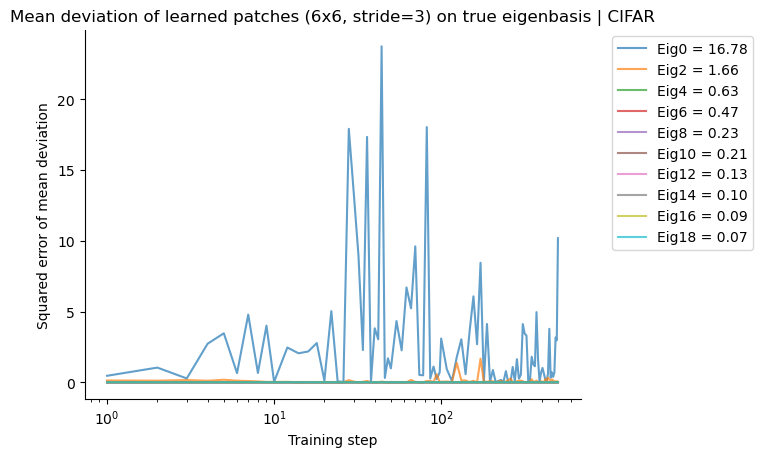

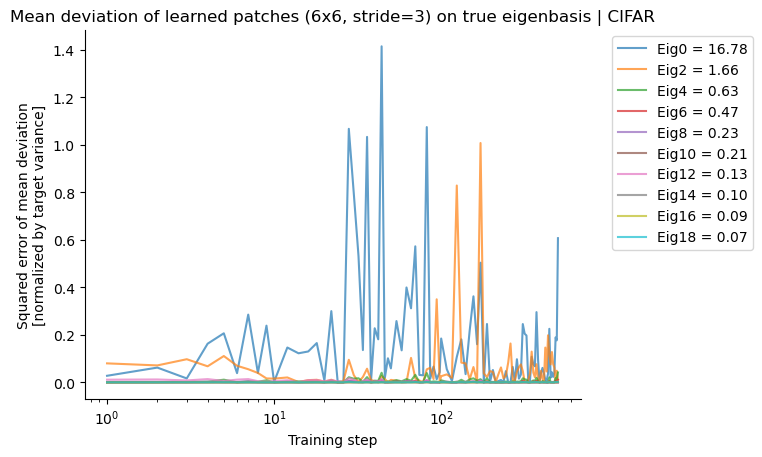

In [48]:
slice2plot = slice(0, 20, 2)
plot_variance_trajectories(step_slice, diag_cov_x_patch_sample_true_eigenbasis_traj.cpu(), patch_eigval.cpu(), slice2plot,
                               patch_size=6, patch_stride=3, savedir=savedir, dataset_name="CIFAR")
plot_mean_deviation_trajectories(step_slice, mean_x_patch_sample_traj, patch_mean, patch_eigvec.cpu(), patch_eigval.cpu(), 
                                     slice2plot, patch_size=6, patch_stride=3, savedir=savedir, dataset_name="CIFAR")


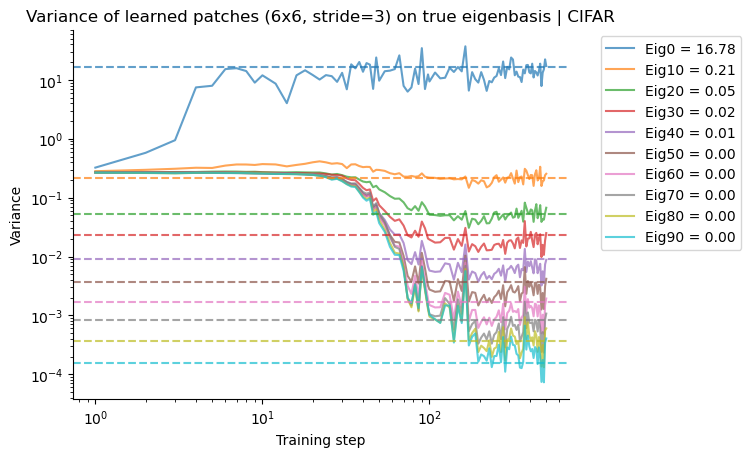

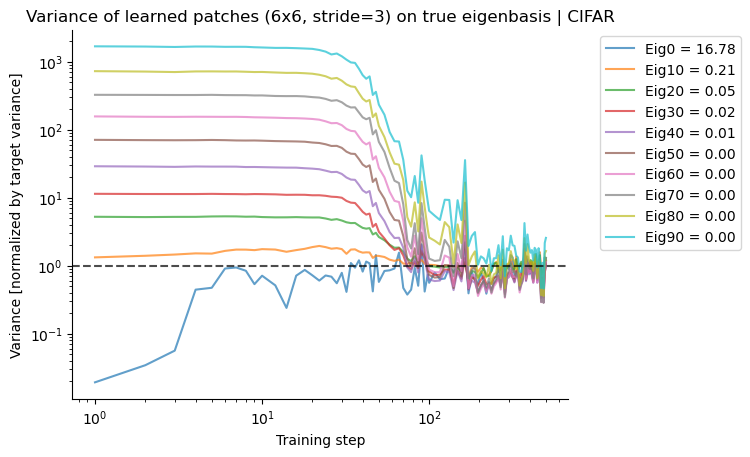

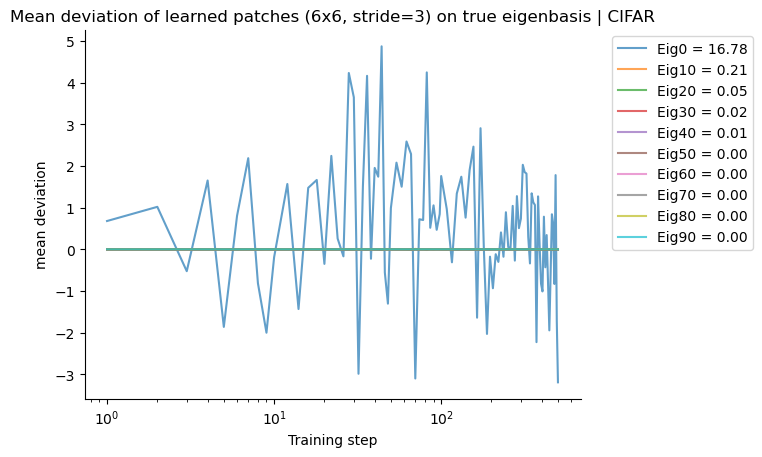

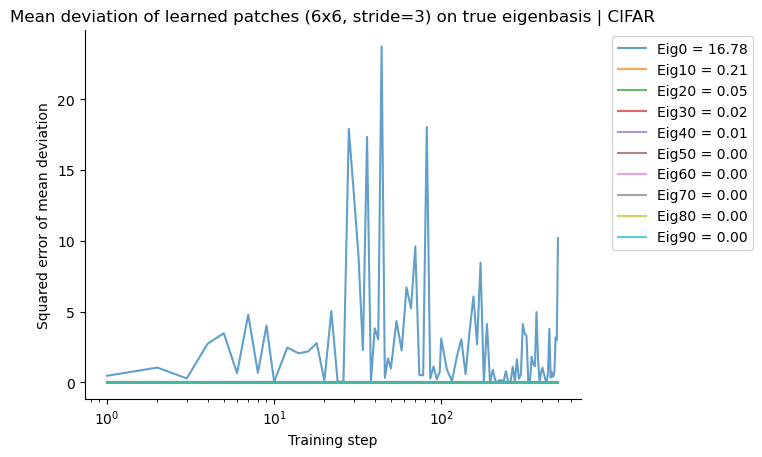

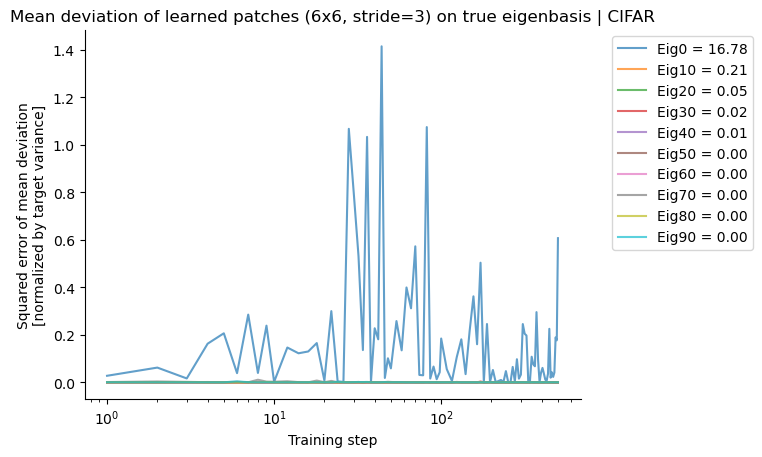

In [49]:
slice2plot = slice(0, 100, 10)
plot_variance_trajectories(step_slice, diag_cov_x_patch_sample_true_eigenbasis_traj.cpu(), patch_eigval.cpu(), slice2plot,
                               patch_size=6, patch_stride=3, savedir=savedir, dataset_name="CIFAR")
plot_mean_deviation_trajectories(step_slice, mean_x_patch_sample_traj, patch_mean, patch_eigvec.cpu(), patch_eigval.cpu(), 
                                     slice2plot, patch_size=6, patch_stride=3, savedir=savedir, dataset_name="CIFAR")


### AFHQ

In [21]:
Xtsr, imgsize = load_dataset("AFHQ")
savedir = r"/n/holylfs06/LABS/kempner_fellow_binxuwang/Users/binxuwang/DL_Projects/DiffusionSpectralLearningCurve/AFHQ_UNet_CNN_EDM_4blocks_wide64_attn_pilot_fixednorm"
sampledir = r"/n/holylfs06/LABS/kempner_fellow_binxuwang/Users/binxuwang/DL_Projects/DiffusionSpectralLearningCurve/AFHQ_UNet_CNN_EDM_4blocks_wide64_attn_pilot_fixednorm/samples"
sample_store = sweep_and_create_sample_store(sampledir)

AFHQ dataset: 15803
value range 250 0
Normalizing dataset to [-1.0, 1.0]


  0%|          | 0/494 [00:00<?, ?it/s]

#### patch 3x3 stride 1

In [22]:
step_slice = sorted(sample_store.keys())
patch_mean, patch_cov, patch_eigval, patch_eigvec, mean_x_patch_sample_traj, cov_x_patch_sample_traj, diag_cov_x_patch_sample_true_eigenbasis_traj = \
     process_patch_mean_cov_statistics(Xtsr, sample_store, savedir, patch_size=3, patch_stride=1, device="cuda", imgshape=(3, 64, 64))

patch_cov.shape: torch.Size([27]) computed on 15803 images


  0%|          | 0/494 [00:00<?, ?it/s]

Saved to /n/holylfs06/LABS/kempner_fellow_binxuwang/Users/binxuwang/DL_Projects/DiffusionSpectralLearningCurve/AFHQ_UNet_CNN_EDM_4blocks_wide64_attn_pilot_fixednorm/sample_patch_3x3_stride_1_cov_true_eigenbasis_diag_traj.pkl


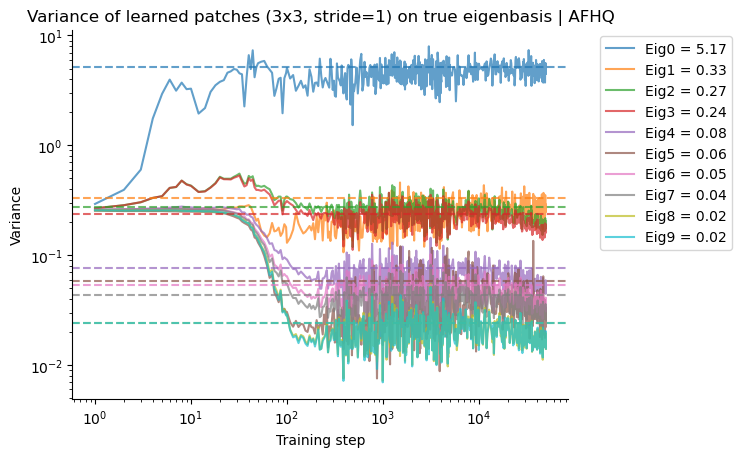

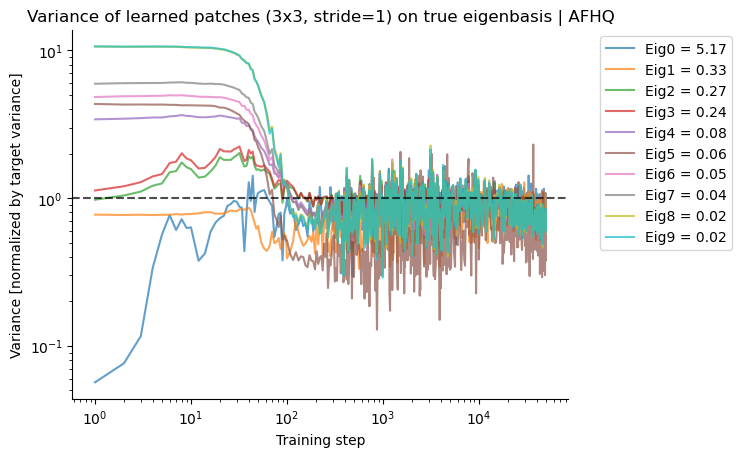

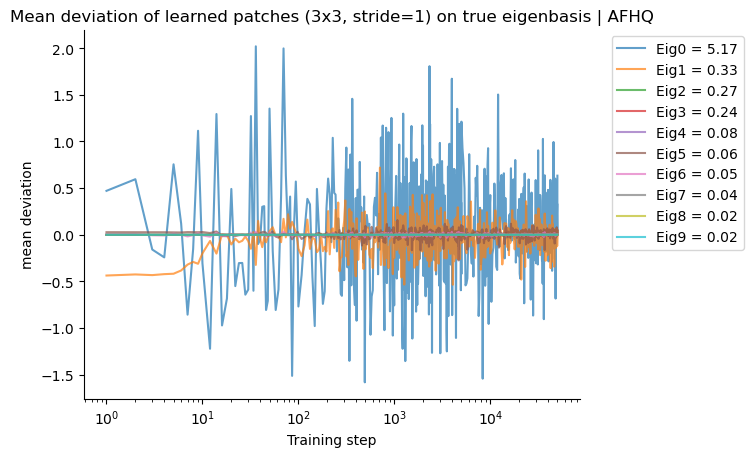

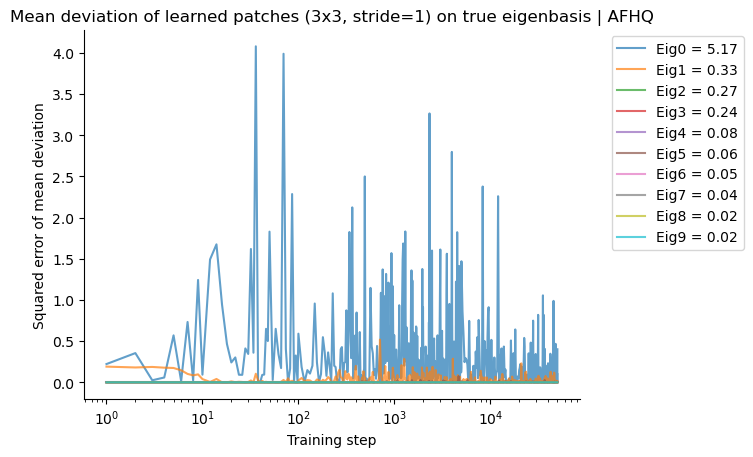

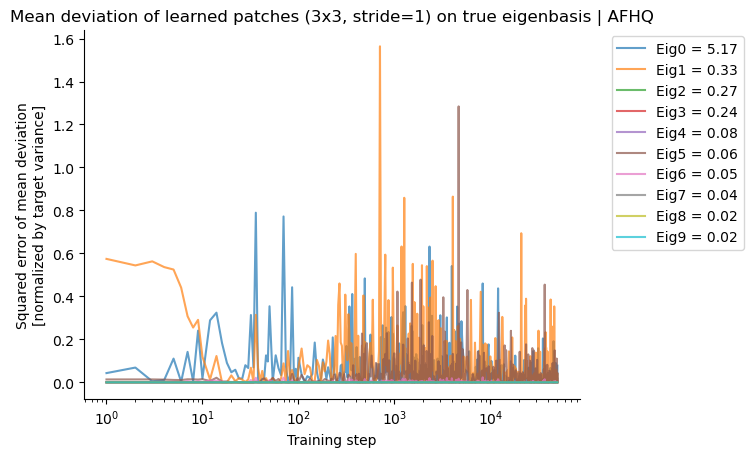

In [24]:
slice2plot = slice(0, 10, 1)
plot_variance_trajectories(step_slice, diag_cov_x_patch_sample_true_eigenbasis_traj.cpu(), patch_eigval.cpu(), slice2plot,
                               patch_size=3, patch_stride=1, savedir=savedir, dataset_name="AFHQ")
plot_mean_deviation_trajectories(step_slice, mean_x_patch_sample_traj, patch_mean, patch_eigvec.cpu(), patch_eigval.cpu(), 
                                     slice2plot, patch_size=3, patch_stride=1, savedir=savedir, dataset_name="AFHQ")

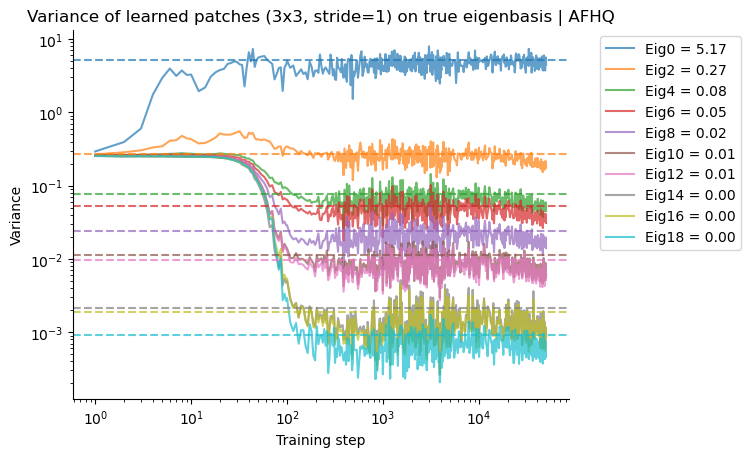

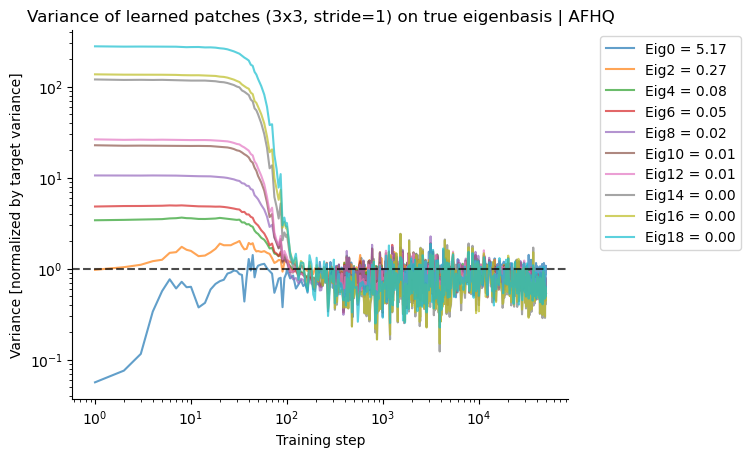

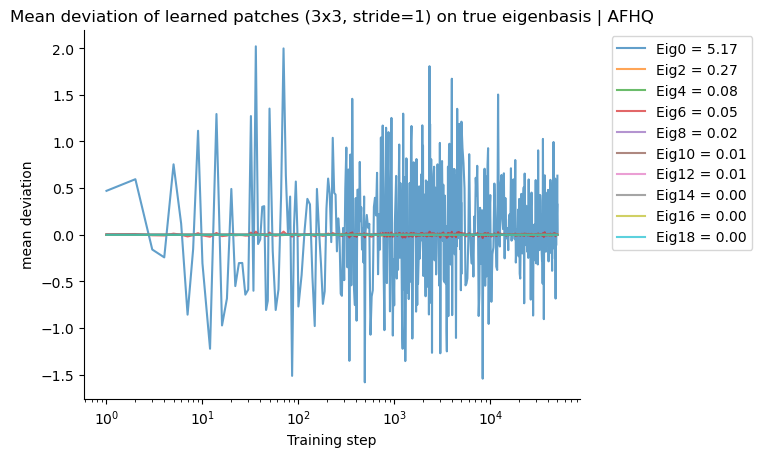

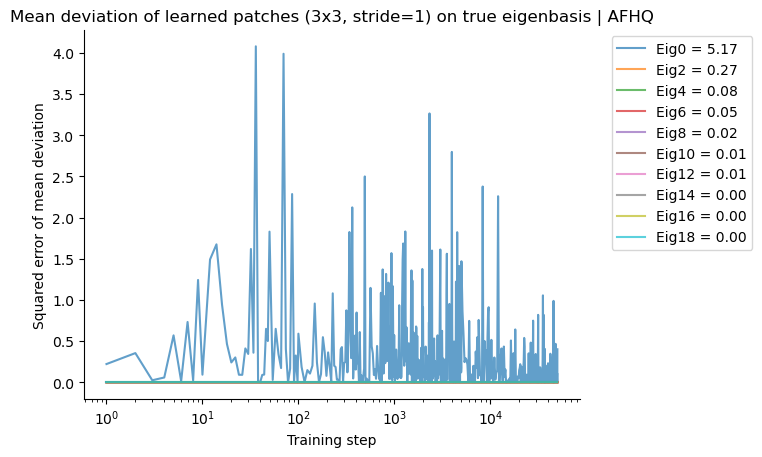

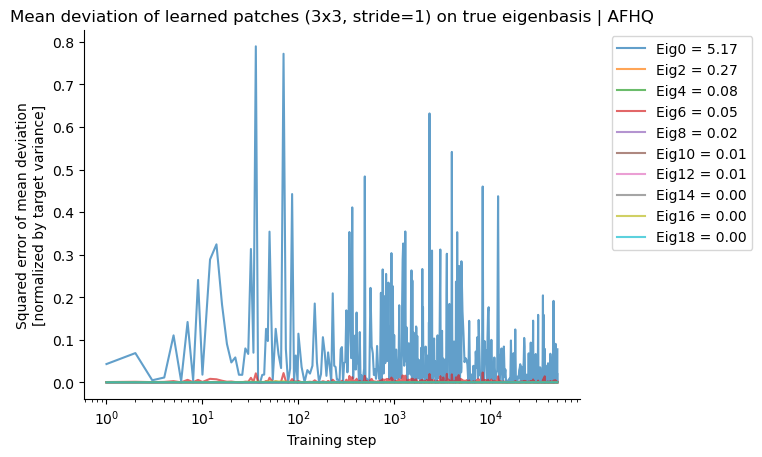

In [23]:
slice2plot = slice(0, 20, 2)
plot_variance_trajectories(step_slice, diag_cov_x_patch_sample_true_eigenbasis_traj.cpu(), patch_eigval.cpu(), slice2plot,
                               patch_size=3, patch_stride=1, savedir=savedir, dataset_name="AFHQ")
plot_mean_deviation_trajectories(step_slice, mean_x_patch_sample_traj, patch_mean, patch_eigvec.cpu(), patch_eigval.cpu(), 
                                     slice2plot, patch_size=3, patch_stride=1, savedir=savedir, dataset_name="AFHQ")

#### Patch 6x6 stride 3

In [25]:
step_slice = sorted(sample_store.keys())
patch_mean, patch_cov, patch_eigval, patch_eigvec, mean_x_patch_sample_traj, cov_x_patch_sample_traj, diag_cov_x_patch_sample_true_eigenbasis_traj = \
     process_patch_mean_cov_statistics(Xtsr, sample_store, savedir, patch_size=6, patch_stride=3, device="cuda", imgshape=(3, 64, 64))

patch_cov.shape: torch.Size([108]) computed on 15803 images


  0%|          | 0/494 [00:00<?, ?it/s]

Saved to /n/holylfs06/LABS/kempner_fellow_binxuwang/Users/binxuwang/DL_Projects/DiffusionSpectralLearningCurve/AFHQ_UNet_CNN_EDM_4blocks_wide64_attn_pilot_fixednorm/sample_patch_6x6_stride_3_cov_true_eigenbasis_diag_traj.pkl


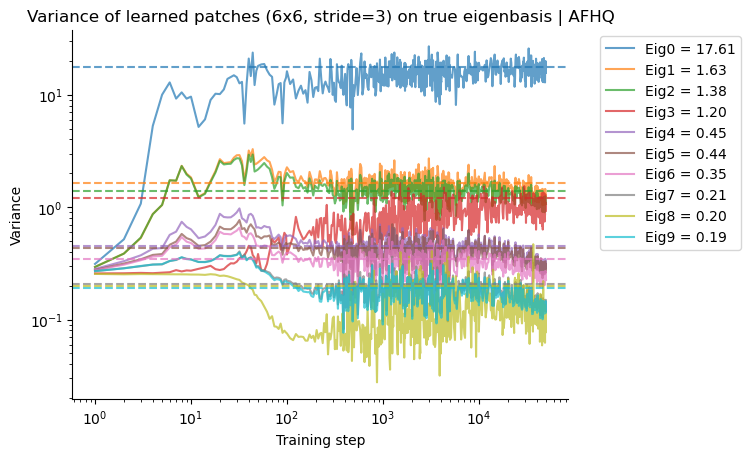

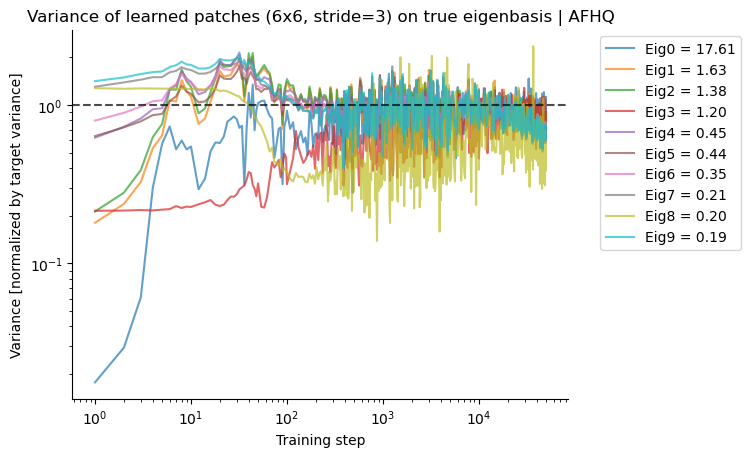

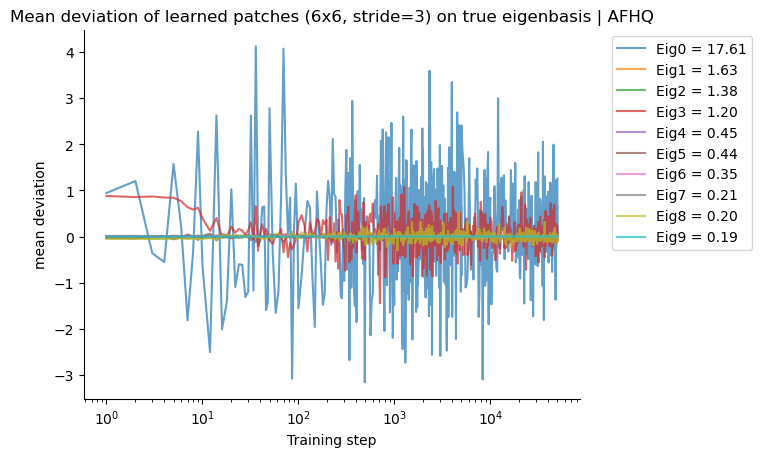

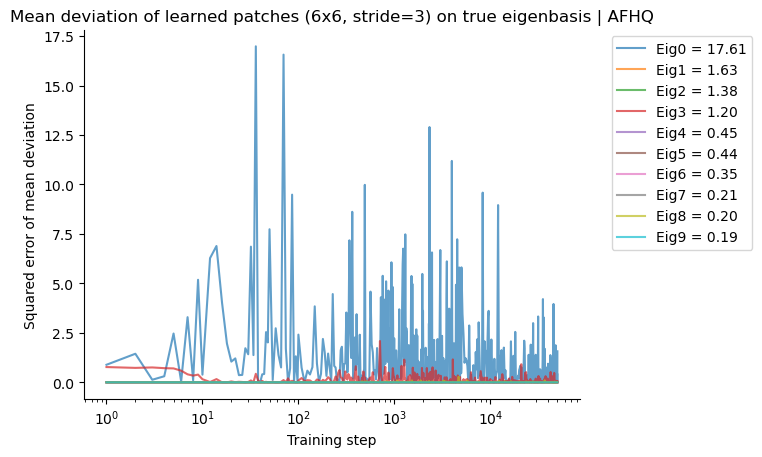

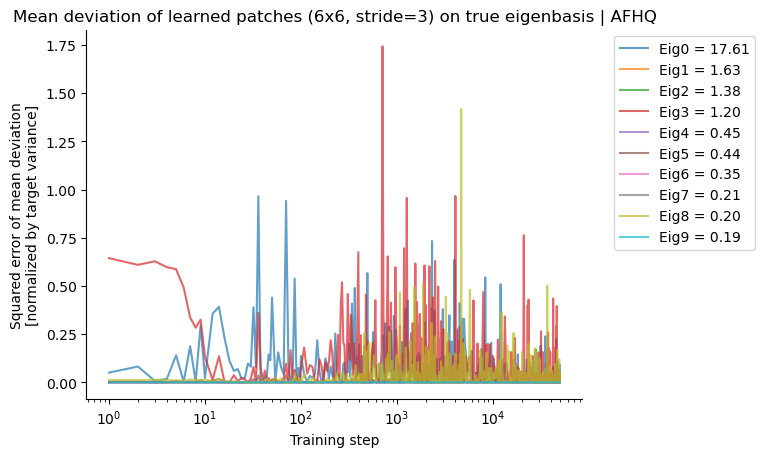

In [28]:
slice2plot = slice(0, 10, 1)
plot_variance_trajectories(step_slice, diag_cov_x_patch_sample_true_eigenbasis_traj.cpu(), patch_eigval.cpu(), slice2plot,
                               patch_size=6, patch_stride=3, savedir=savedir, dataset_name="AFHQ")
plot_mean_deviation_trajectories(step_slice, mean_x_patch_sample_traj, patch_mean, patch_eigvec.cpu(), patch_eigval.cpu(), 
                                     slice2plot, patch_size=6, patch_stride=3, savedir=savedir, dataset_name="AFHQ")

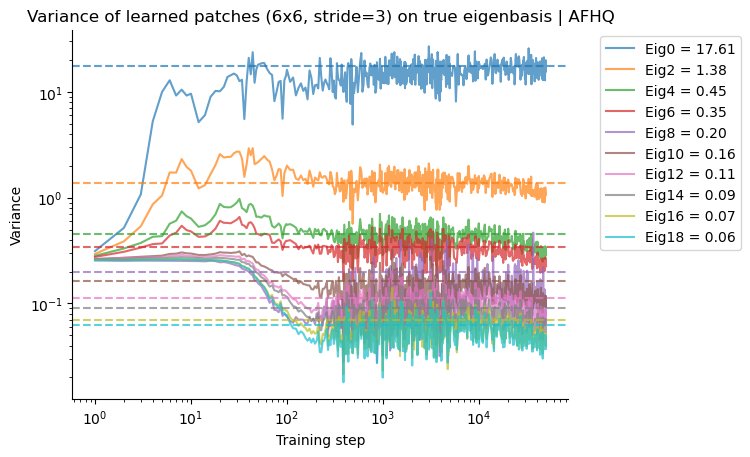

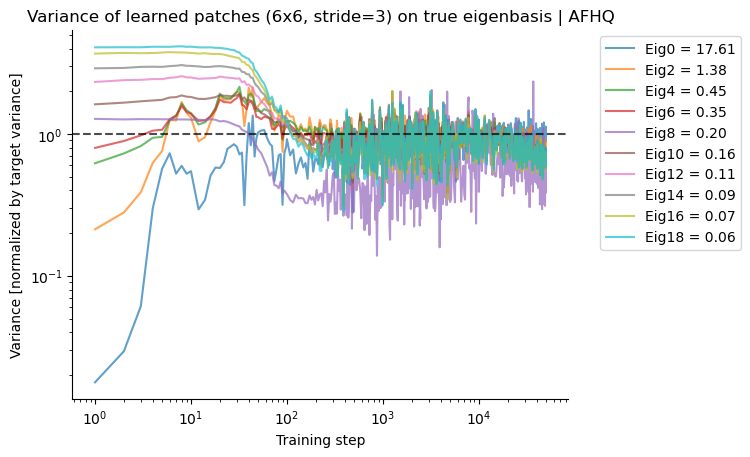

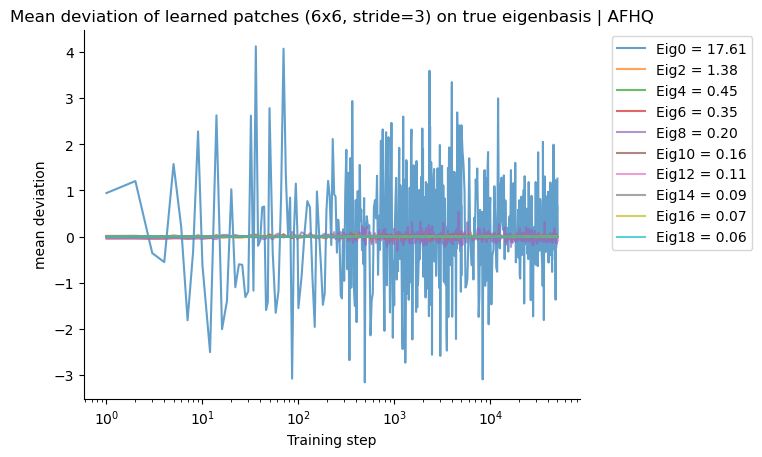

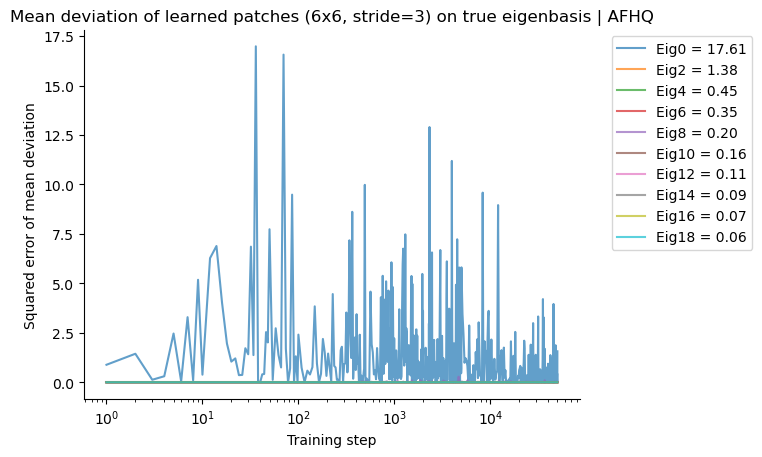

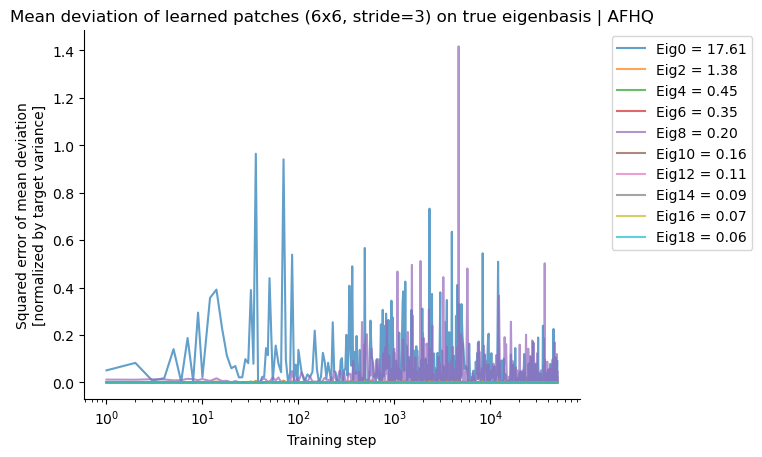

In [27]:
slice2plot = slice(0, 20, 2)
plot_variance_trajectories(step_slice, diag_cov_x_patch_sample_true_eigenbasis_traj.cpu(), patch_eigval.cpu(), slice2plot,
                               patch_size=6, patch_stride=3, savedir=savedir, dataset_name="AFHQ")
plot_mean_deviation_trajectories(step_slice, mean_x_patch_sample_traj, patch_mean, patch_eigvec.cpu(), patch_eigval.cpu(), 
                                     slice2plot, patch_size=6, patch_stride=3, savedir=savedir, dataset_name="AFHQ")

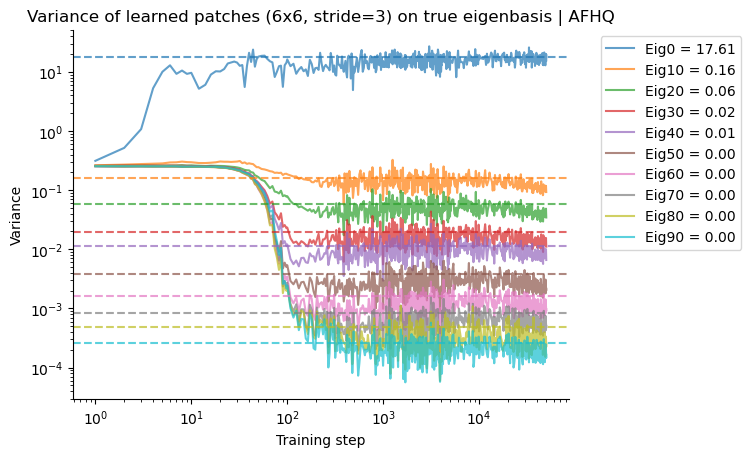

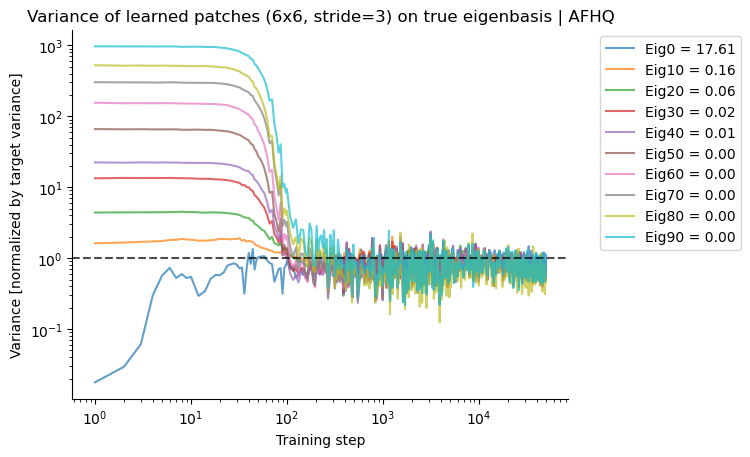

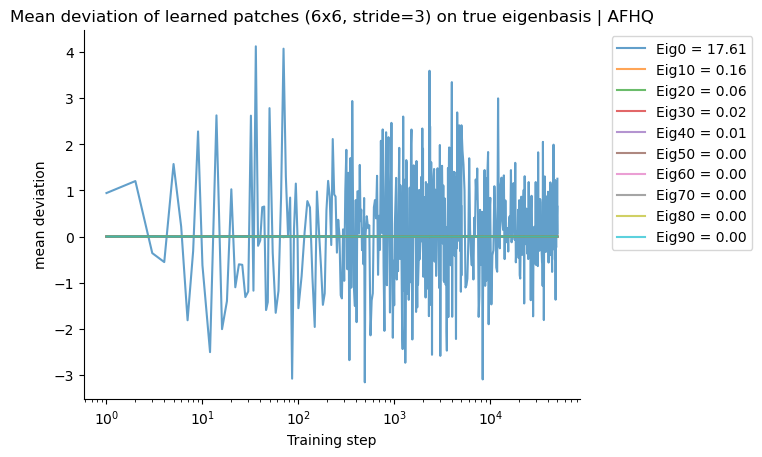

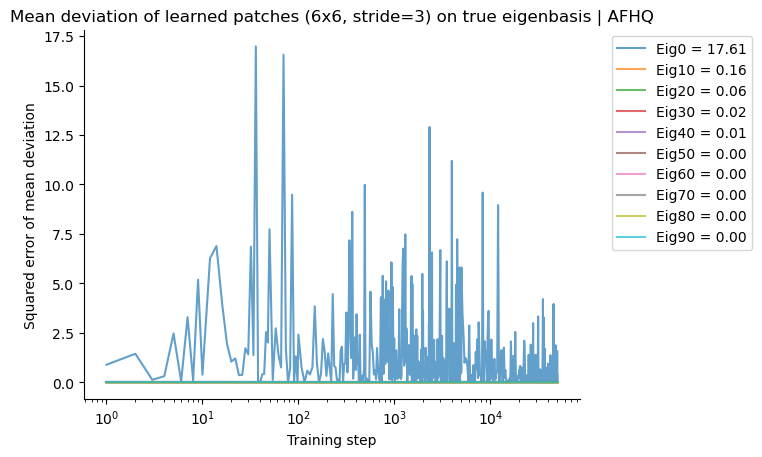

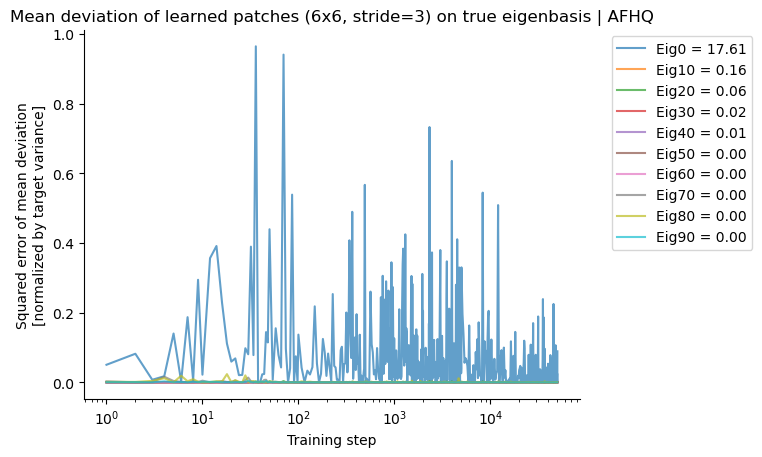

In [26]:
slice2plot = slice(0, 100, 10)
plot_variance_trajectories(step_slice, diag_cov_x_patch_sample_true_eigenbasis_traj.cpu(), patch_eigval.cpu(), slice2plot,
                               patch_size=6, patch_stride=3, savedir=savedir, dataset_name="AFHQ")
plot_mean_deviation_trajectories(step_slice, mean_x_patch_sample_traj, patch_mean, patch_eigvec.cpu(), patch_eigval.cpu(), 
                                     slice2plot, patch_size=6, patch_stride=3, savedir=savedir, dataset_name="AFHQ")

#### patch 9x9 stride 3

In [ ]:
step_slice = sorted(sample_store.keys())
patch_mean, patch_cov, patch_eigval, patch_eigvec, mean_x_patch_sample_traj, cov_x_patch_sample_traj, diag_cov_x_patch_sample_true_eigenbasis_traj = \
     process_patch_mean_cov_statistics(Xtsr, sample_store, savedir, patch_size=9, patch_stride=3, device="cuda", imgshape=(3, 64, 64))

patch_cov.shape: torch.Size([243]) computed on 15803 images


  0%|          | 0/494 [00:00<?, ?it/s]

Saved to /n/holylfs06/LABS/kempner_fellow_binxuwang/Users/binxuwang/DL_Projects/DiffusionSpectralLearningCurve/AFHQ_UNet_CNN_EDM_4blocks_wide64_attn_pilot_fixednorm/sample_patch_9x9_stride_3_cov_true_eigenbasis_diag_traj.pkl


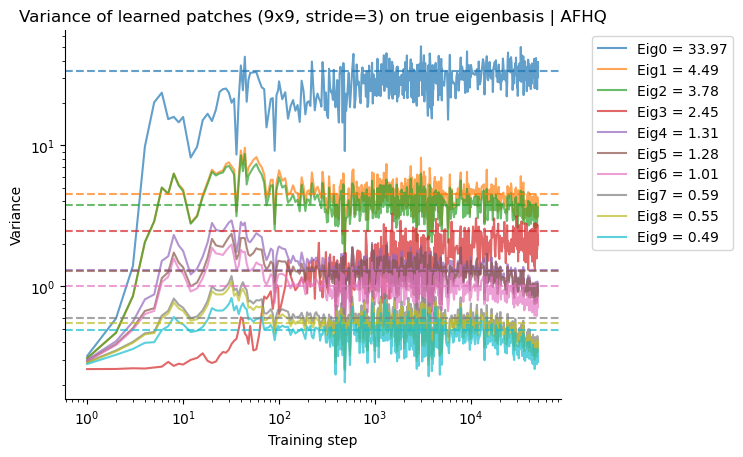

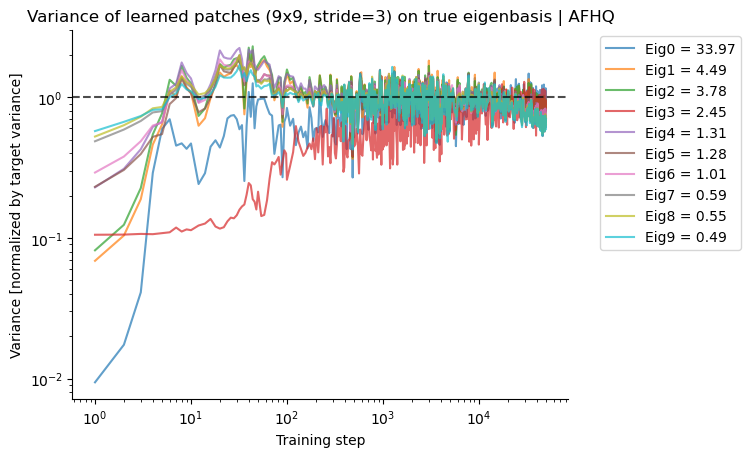

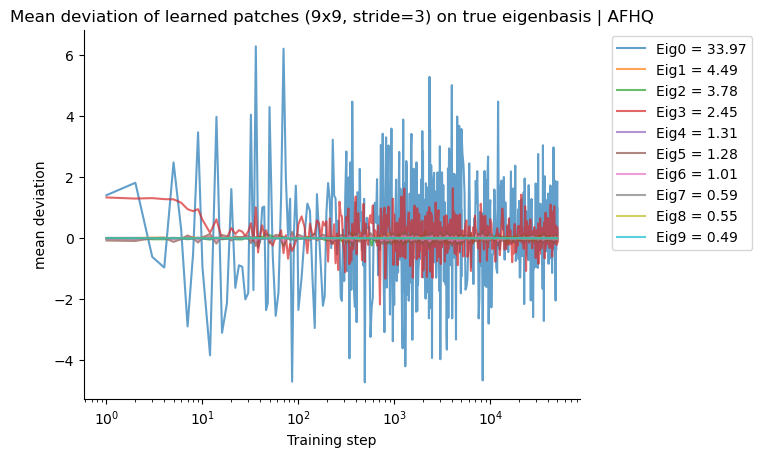

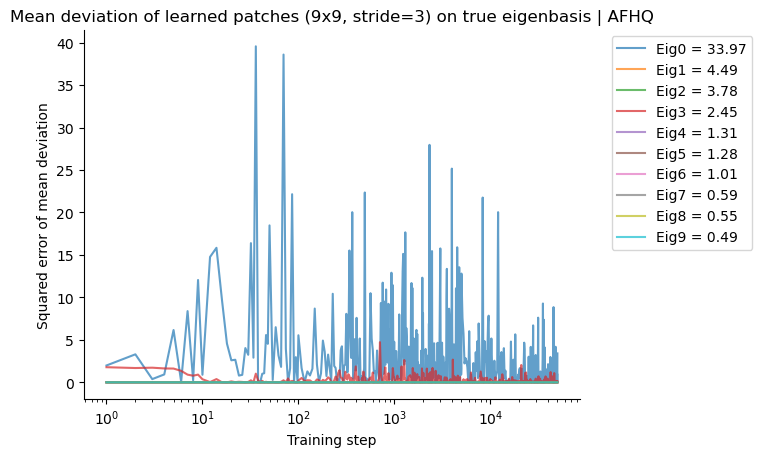

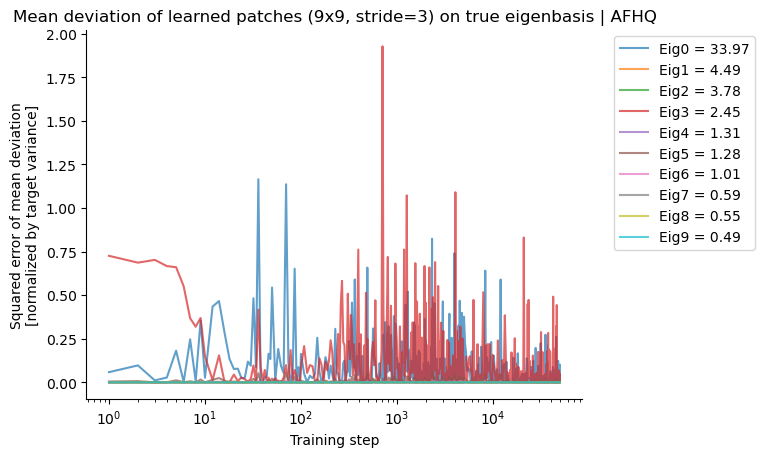

In [ ]:
slice2plot = slice(0, 10, 1)
plot_variance_trajectories(step_slice, diag_cov_x_patch_sample_true_eigenbasis_traj.cpu(), patch_eigval.cpu(), slice2plot,
                               patch_size=9, patch_stride=3, savedir=savedir, dataset_name="AFHQ")
plot_mean_deviation_trajectories(step_slice, mean_x_patch_sample_traj, patch_mean, patch_eigvec.cpu(), patch_eigval.cpu(), 
                                     slice2plot, patch_size=9, patch_stride=3, savedir=savedir, dataset_name="AFHQ")

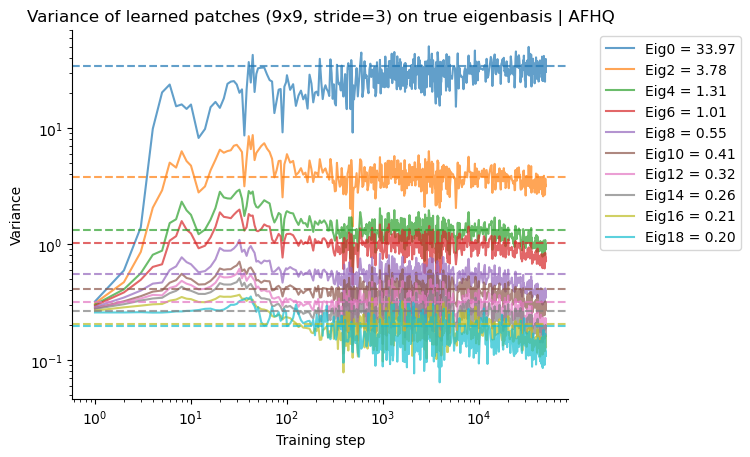

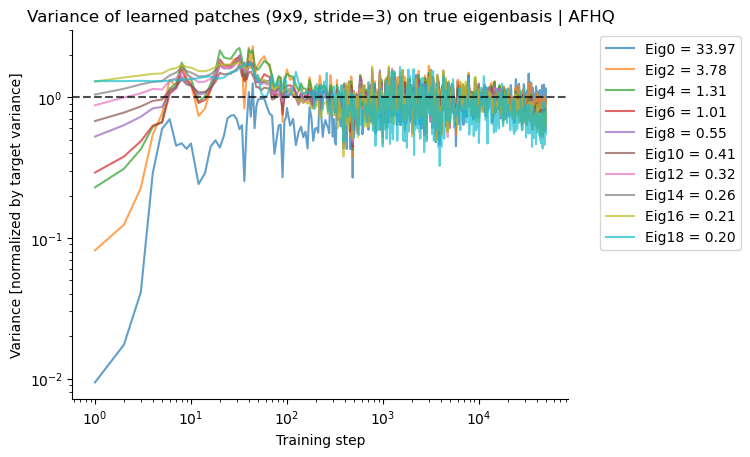

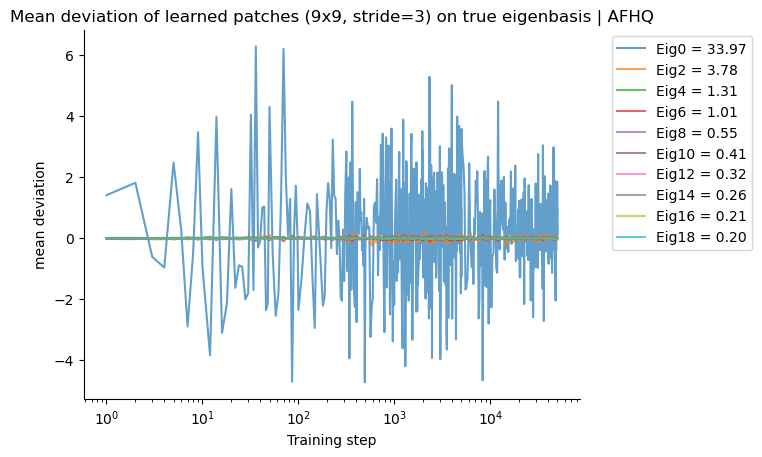

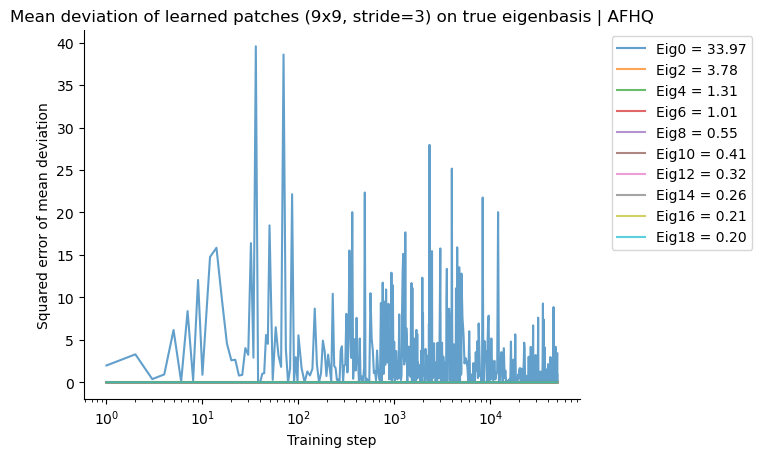

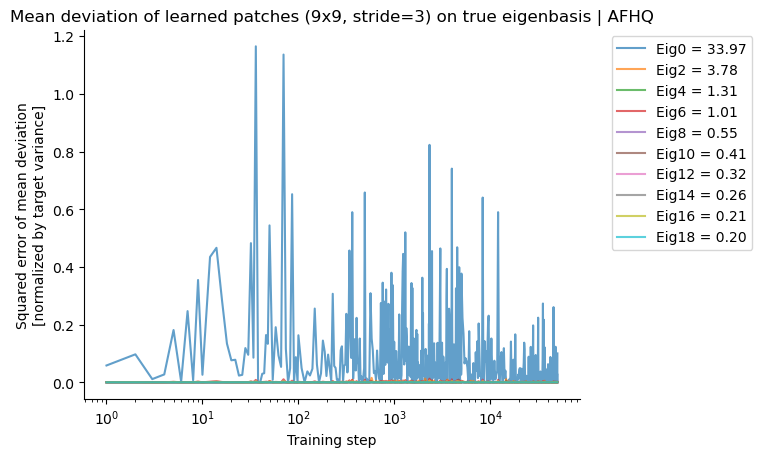

In [ ]:
slice2plot = slice(0, 20, 2)
plot_variance_trajectories(step_slice, diag_cov_x_patch_sample_true_eigenbasis_traj.cpu(), patch_eigval.cpu(), slice2plot,
                               patch_size=9, patch_stride=3, savedir=savedir, dataset_name="AFHQ")
plot_mean_deviation_trajectories(step_slice, mean_x_patch_sample_traj, patch_mean, patch_eigvec.cpu(), patch_eigval.cpu(), 
                                     slice2plot, patch_size=9, patch_stride=3, savedir=savedir, dataset_name="AFHQ")